In [1]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score,classification_report,roc_curve,roc_auc_score,confusion_matrix,precision_recall_curve,precision_score,recall_score,f1_score
from sklearn.model_selection import train_test_split,cross_val_score,StratifiedKFold,cross_val_predict
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder,FunctionTransformer
from imblearn.under_sampling import RandomUnderSampler,NearMiss,TomekLinks,InstanceHardnessThreshold
from sklearn.compose import ColumnTransformer
import optuna
from sklearn.metrics import average_precision_score
from sklearn.utils import shuffle

pd.options.display.float_format = '{:,.2f}'.format


In [2]:
df = pd.read_csv('Fraud.csv')

In [3]:
df.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,1,PAYMENT,"9,839.64",C1231006815,"170,136.00","160,296.36",M1979787155,0.00,0.00,0,0
1,1,PAYMENT,"1,864.28",C1666544295,"21,249.00","19,384.72",M2044282225,0.00,0.00,0,0
2,1,TRANSFER,181.00,C1305486145,181.00,0.00,C553264065,0.00,0.00,1,0
3,1,CASH_OUT,181.00,C840083671,181.00,0.00,C38997010,"21,182.00",0.00,1,0
4,1,PAYMENT,"11,668.14",C2048537720,"41,554.00","29,885.86",M1230701703,0.00,0.00,0,0


# Basic Preprocessing

In [4]:
df.shape
# 63.6 lakhs rows and 11 columns

(6362620, 11)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6362620 entries, 0 to 6362619
Data columns (total 11 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            int64  
 1   type            object 
 2   amount          float64
 3   nameOrig        object 
 4   oldbalanceOrg   float64
 5   newbalanceOrig  float64
 6   nameDest        object 
 7   oldbalanceDest  float64
 8   newbalanceDest  float64
 9   isFraud         int64  
 10  isFlaggedFraud  int64  
dtypes: float64(5), int64(3), object(3)
memory usage: 534.0+ MB


In [6]:
df.isnull().sum()
# No Missing Values

step              0
type              0
amount            0
nameOrig          0
oldbalanceOrg     0
newbalanceOrig    0
nameDest          0
oldbalanceDest    0
newbalanceDest    0
isFraud           0
isFlaggedFraud    0
dtype: int64

In [7]:
df.duplicated().sum()
# No Duplicated Transactions

0

In [8]:
df['isFraud'].value_counts()/df.shape[0]
# Data Highly Imbalance
# means if we predict each transaction as fraud then we will get 99.99 times correct.

isFraud
0   1.00
1   0.00
Name: count, dtype: float64

In [9]:
df[(df['nameDest'].str.startswith('M'))|(df['nameOrig'].str.startswith('M'))]['isFraud'].value_counts()

isFraud
0    2151495
Name: count, dtype: int64

# Insight : 

Whenever a Merchant account (M...) is involved — either as sender or receiver — there is NOT A SINGLE fraudulent transaction in the dataset.

So:

Merchant → Customer -> No fraud

Customer → Merchant -> No fraud

Merchant → Merchant -> No fraud

All fraud happens only between Customer ↔ Customer accounts (C...).

# Action:

Merchant transactions can be deprioritized for fraud screening

Monitoring resources should focus on Customer-to-Customer transfers

# Handle Huge Data

In [10]:
# drop marchent account involved transactions.
df = df[~((df['nameDest'].str.startswith('M'))|(df['nameOrig'].str.startswith('M')))]
df.shape

(4211125, 11)

In [11]:
# drop sender and reciever account info columns
df.drop(columns=['nameOrig','nameDest'],inplace=True)

In [12]:
# changed datatypes for memory efficiency
df['isFraud'] = df['isFraud'].astype('bool')
df['isFlaggedFraud'] = df['isFlaggedFraud'].astype('bool')


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4211125 entries, 2 to 6362619
Data columns (total 9 columns):
 #   Column          Dtype  
---  ------          -----  
 0   step            int64  
 1   type            object 
 2   amount          float64
 3   oldbalanceOrg   float64
 4   newbalanceOrig  float64
 5   oldbalanceDest  float64
 6   newbalanceDest  float64
 7   isFraud         bool   
 8   isFlaggedFraud  bool   
dtypes: bool(2), float64(5), int64(1), object(1)
memory usage: 265.1+ MB


# EDA

In [14]:
# using 25% random non_fraud data as for sample
fraud_df = df[df['isFraud']==True]
non_fraud_df = df[df['isFraud']==False].sample(int(len(df) * 0.25),random_state=42)
eda_df = pd.concat([fraud_df, non_fraud_df])
eda_df = eda_df.sample(len(eda_df))
eda_df.shape

(1060994, 9)

In [15]:
eda_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1060994 entries, 3091208 to 6229820
Data columns (total 9 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   step            1060994 non-null  int64  
 1   type            1060994 non-null  object 
 2   amount          1060994 non-null  float64
 3   oldbalanceOrg   1060994 non-null  float64
 4   newbalanceOrig  1060994 non-null  float64
 5   oldbalanceDest  1060994 non-null  float64
 6   newbalanceDest  1060994 non-null  float64
 7   isFraud         1060994 non-null  bool   
 8   isFlaggedFraud  1060994 non-null  bool   
dtypes: bool(2), float64(5), int64(1), object(1)
memory usage: 66.8+ MB


In [16]:
eda_df.columns
num_cols = eda_df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = [col for col in eda_df.columns if col not in num_cols]
bool_cols = eda_df.select_dtypes(include=[bool]).columns.tolist()
num_cols,cat_cols,bool_cols

(['step',
  'amount',
  'oldbalanceOrg',
  'newbalanceOrig',
  'oldbalanceDest',
  'newbalanceDest'],
 ['type', 'isFraud', 'isFlaggedFraud'],
 ['isFraud', 'isFlaggedFraud'])

In [17]:
eda_df[num_cols].describe()

,step,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest
count,"1,060,994.00","1,060,994.00","1,060,994.00","1,060,994.00","1,060,994.00","1,060,994.00"
mean,243.78,"272,810.78","1,223,078.28","1,249,620.25","1,653,358.28","1,845,566.77"
std,143.02,"767,751.73","3,473,830.88","3,507,118.82","4,067,862.20","4,405,204.32"
min,1.00,0.00,0.00,0.00,0.00,0.00
25%,155.00,"76,032.71",0.00,0.00,"135,403.03","219,012.57"
50%,239.00,"159,330.78","18,956.50",0.00,"544,409.72","679,147.62"
75%,335.00,"279,627.27","197,926.80","279,438.60","1,675,931.85","1,900,555.66"
max,743.00,"60,642,003.00","59,585,040.37","49,585,040.37","327,827,763.42","355,553,416.30"


1 .Transaction amounts are highly skewed

Mean amount ≈ ₹2.65L

Median amount ≈ ₹1.59L

Max ≈ ₹9.24 Cr

Insight:
Most transactions are small–medium, but a few very large transactions exist (outliers).

2 .Many users start with zero balance

oldbalanceOrg: 25% = 0

Median = ₹18K

newbalanceOrig: 50% = 0

Insight:
A large number of transactions involve emptying accounts completely —
this aligns with fraud behavior (account drain).

3️ .Destination balances are much higher

oldbalanceDest median ≈ ₹5.5L

newbalanceDest median ≈ ₹6.8L

Max destination balance > ₹35 Cr

Insight:
Fraudsters often transfer money into high-balance accounts, making detection harder.

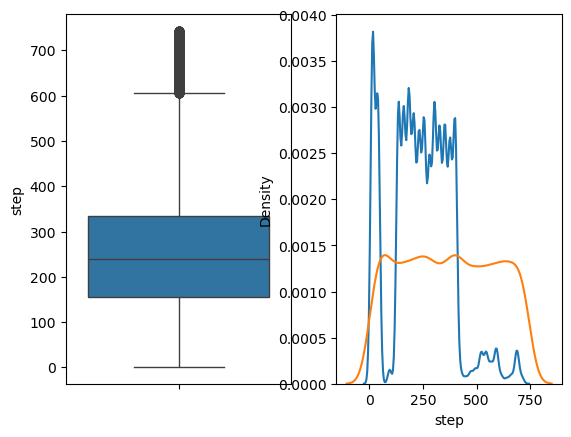

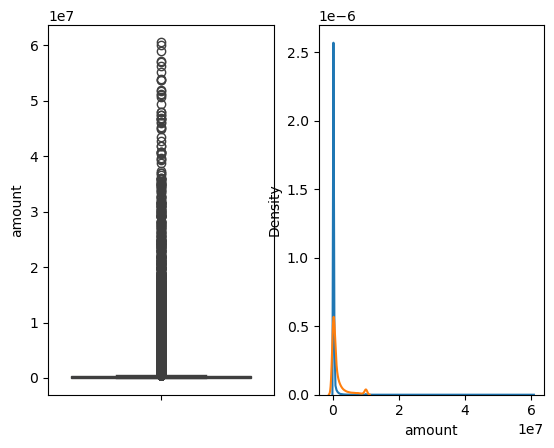

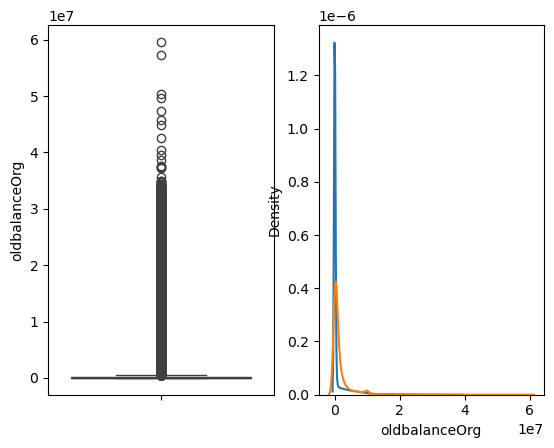

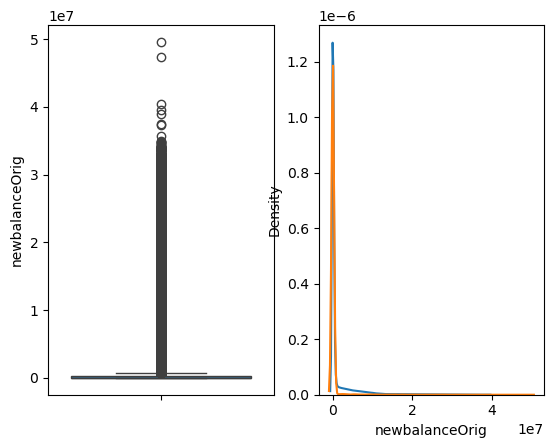

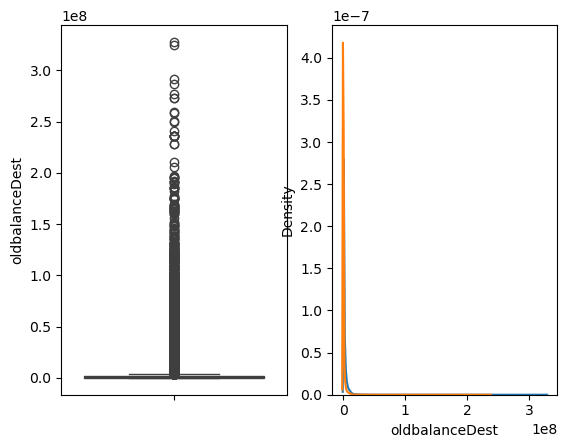

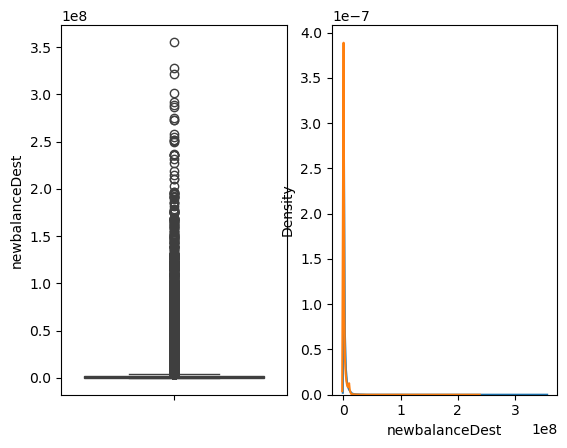

In [18]:
for i in num_cols:
    if i in ['isFraud','isFlaggedFraud']:
        continue
    else:
      fig,ax = plt.subplots(nrows=1,ncols=2)
      sns.boxplot(eda_df[i],ax=ax[0])
      sns.kdeplot(eda_df[eda_df['isFraud']==0][i],ax=ax[1])
      sns.kdeplot(eda_df[eda_df['isFraud']==1][i],ax=ax[1])

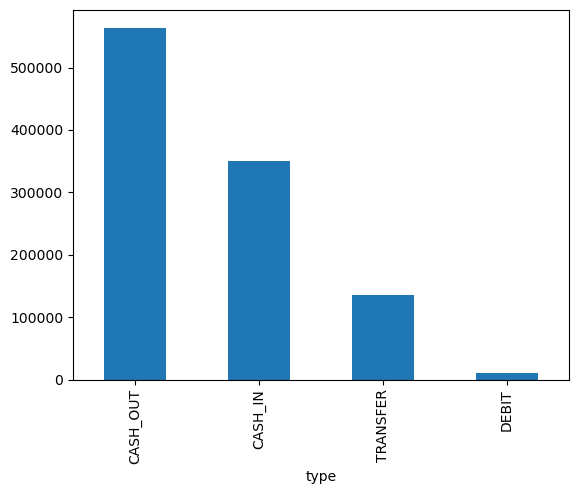

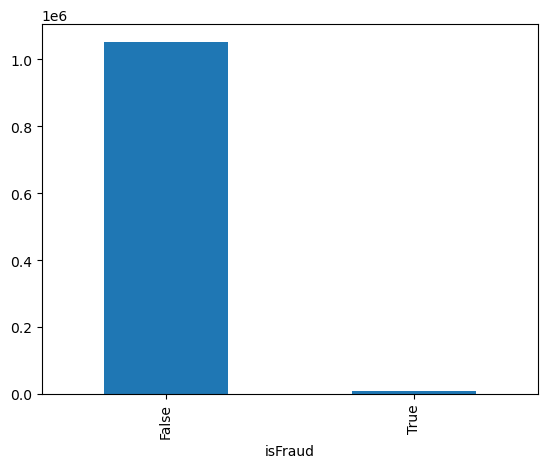

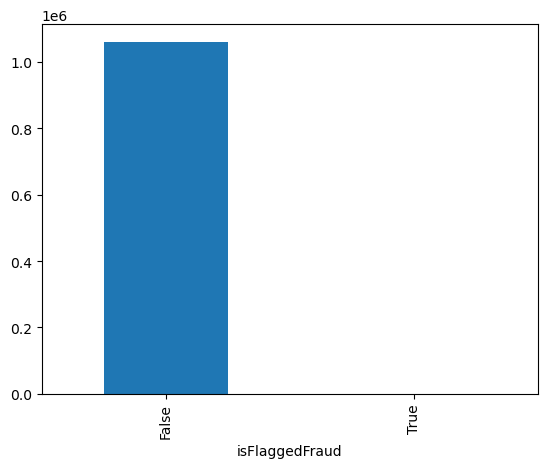

In [19]:
for col in cat_cols:
    eda_df[col].value_counts().plot(kind='bar')
    plt.show()

In [20]:
# isFraud vs type
hours = eda_df['step']%24
hours.value_counts()

step
19    112372
18    101300
20     90538
12     82680
13     80808
16     76391
17     76162
11     75976
14     75507
15     72029
10     71976
9      46815
21     36755
22     25236
23     16204
0       7968
8       4106
1       3305
2       1453
7       1287
6        668
3        551
5        513
4        394
Name: count, dtype: int64

In [21]:
bins = [0, 6, 12, 18, 24]
labels = ['Late Night', 'Morning', 'Afternoon', 'Night']

buckets =  pd.cut(
    hours,
    bins=bins,
    labels=labels,
    right=False  # 0-5, 6-11, 12-17, 18-23
)


<Axes: xlabel='isFraud', ylabel='step'>

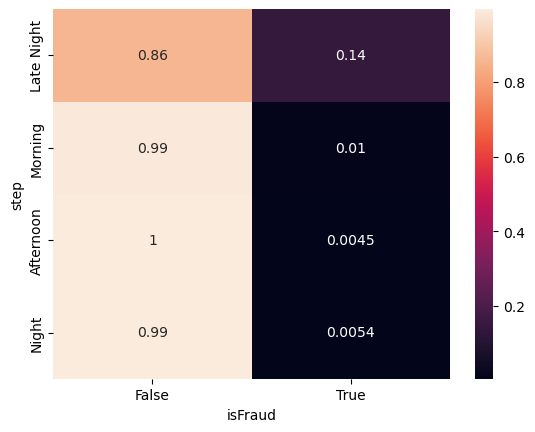

In [22]:
sns.heatmap(pd.crosstab(index=buckets,columns=eda_df['isFraud'],normalize='index'),annot=True)

Insight :

1 . Late Night has a very high fraud concentration

14% of Late Night transactions are fraud

This is extremely high compared to other time buckets

Strong signal that fraudsters prefer late-night hours


️2 . Morning transactions are mostly safe

Only ~1% fraud

Suggests normal user activity dominates in mornings

3 . Afternoon is the safest

Fraud rate is ~0.45%

Lowest fraud occurrence among all time buckets

4 . Night (evening) has low but slightly higher fraud than afternoon

Fraud rate ~0.54%

Still much lower than late night

Why this makes sense ?

Late night hours: Less monitoring , Users inactive / sleeping , Fraudsters exploit low vigilance

Daytime: Normal transactional behavior , Higher user awareness

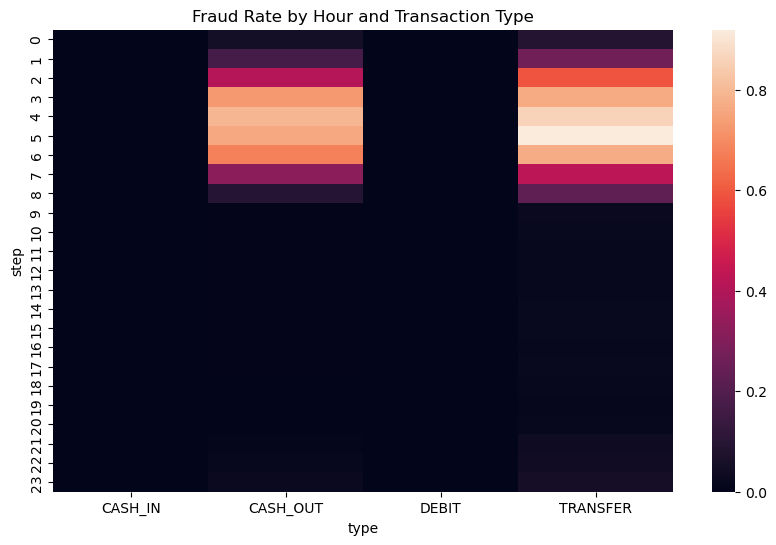

In [23]:
pivot = eda_df.pivot_table(
    index=hours,
    columns='type',
    values='isFraud',
    aggfunc='mean'
)

plt.figure(figsize=(10,6))
sns.heatmap(pivot, cmap='rocket')
plt.title("Fraud Rate by Hour and Transaction Type")
plt.show()


Insight : 

1 . Fraud is concentrated in specific hours

Fraud mostly occurs during late-night to early-morning hours (≈ 1–7 AM).

During daytime hours, fraud rate is almost zero across all transaction types.

2️ .  Fraud mainly happens in CASH_OUT and TRANSFER

CASH_IN and DEBIT show almost no fraud at any hour.

CASH_OUT and TRANSFER have very high fraud rates at night.

3️ . TRANSFER has the highest fraud intensity

Late-night TRANSFER transactions show the strongest fraud signal.

Suggests fraudsters prefer transferring money between accounts at night.

Fraudsters exploit late-night hours when monitoring is low and mostly use CASH_OUT or TRANSFER transactions to move money quickly.

In [24]:
# add new feature transaction_time in dataframe
eda_df['transaction_time'] = buckets

In [25]:
eda_df.head()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud,transaction_time
3091208,235,TRANSFER,"1,802,595.64","69,511.00",0.00,"8,426,228.02","10,228,823.66",False,False,Night
4462443,323,CASH_OUT,"300,387.02",0.00,0.00,"1,082,193.17","1,382,580.19",False,False,Morning
4403902,321,CASH_OUT,"20,318.37",0.00,0.00,"973,258.09","993,576.46",False,False,Morning
2577640,207,CASH_OUT,"312,938.22","8,082.00",0.00,0.00,"312,938.22",False,False,Afternoon
564166,22,CASH_IN,"254,030.36","310,114.26","564,144.62","511,918.29","257,887.93",False,False,Night


<Axes: xlabel='isFraud', ylabel='type'>

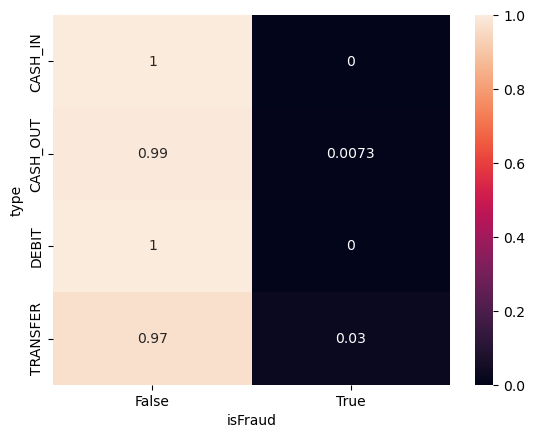

In [26]:
#  isFraud vs type
sns.heatmap(pd.crosstab(eda_df['type'],eda_df['isFraud'],normalize='index'),annot=True,cmap="rocket")

Insights : 
1️ . Fraud happens only in 2 transaction types

TRANSFER → ~3% fraud

CASH_OUT → ~0.7% fraud

CASH_IN & DEBIT → 0% fraud

Fraud is not random. It is concentrated.

2️ . TRANSFER is the most risky transaction

Highest fraud rate among all types

Matches real-world fraud pattern:
money is transferred → then cashed out

TRANSFER should be high-priority for fraud checks.

3️ . CASH_OUT is the second risky type

Fraud exists but lower than TRANSFER

Used mainly to withdraw stolen money

4️ . Some transaction types are almost safe

CASH_IN and DEBIT show zero fraud

Monitoring them aggressively wastes resources

Actions:

-> Apply strict monitoring on TRANSFER & CASH_OUT

-> Relax checks for CASH_IN & DEBIT

-> Improves detection and reduces false alerts

<Axes: xlabel='isFlaggedFraud', ylabel='isFraud'>

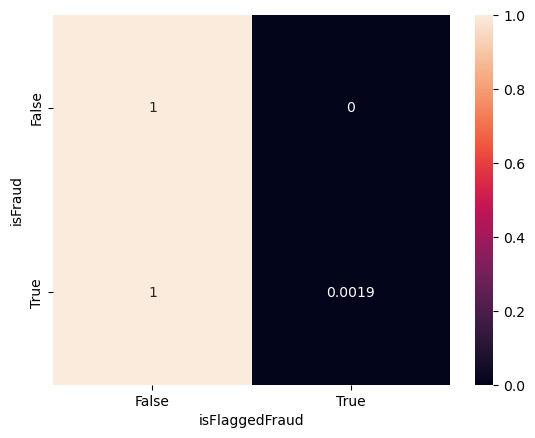

In [27]:
# isFlaggedFraud vs isFraud
sns.heatmap(pd.crosstab(eda_df['isFraud'],eda_df['isFlaggedFraud'],normalize='index'),annot=True,cmap="rocket")

Insights : 

1 . Rule-based system almost never flags fraud

Even when isFraud = True, only ~0.19% transactions are flagged

99.8%+ fraud transactions are NOT flagged

The rule-based system is missing almost all frauds

2 . Flagging is extremely rare

For non-fraud transactions → flag rate ≈ 0

For fraud transactions → still ≈ 0

The rule (amount > 200,000) is too strict and too naive

3 . Rule-based system has very low recall

Recall ≈ 0

It fails to catch real fraud cases

This is dangerous for business because fraud passes undetected

<Axes: xlabel='amount', ylabel='Density'>

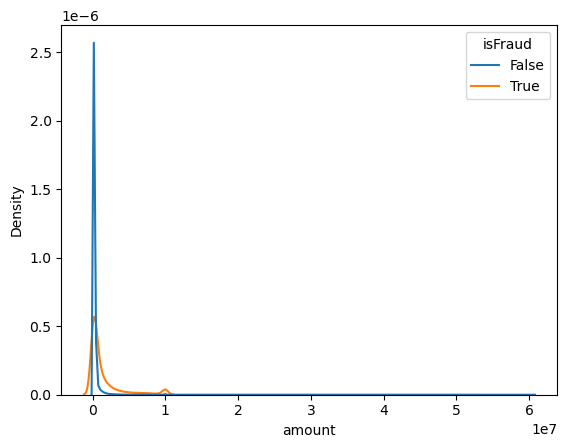

In [28]:
# amount vs isFraud
sns.kdeplot(
    data=eda_df,
    x='amount',
    hue='isFraud',
    common_norm=False
    # log_scale=True
)

Insights :

Fraud transactions tend to have higher amounts. The fraud (orange) curve extends more to the right

Non-fraud transactions are heavily concentrated near very small amounts

Fraud is more likely at relatively higher transaction amounts, but not only at extreme values.

Most transactions (fraud & non-fraud) are small . Shows strong right skew.

Amount alone cannot separate fraud clearly. Curves overlap significantly. No clear cutoff where fraud starts

amount by itself is not sufficient to detect fraud —
it must be combined with transaction type, balance changes, and behavior features.

<Axes: xlabel='oldbalanceOrg', ylabel='Density'>

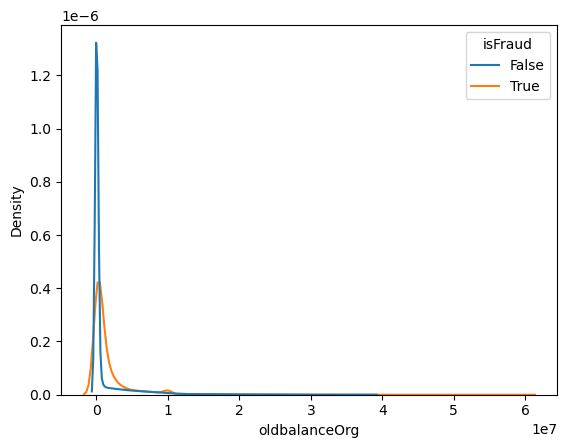

In [29]:
# oldbalanceOrg vs isFraud
sns.kdeplot(
    data=eda_df,
    x='oldbalanceOrg',
    hue='isFraud',
    common_norm=False
    #log_scale=True
)


<Axes: xlabel='newbalanceOrig', ylabel='Density'>

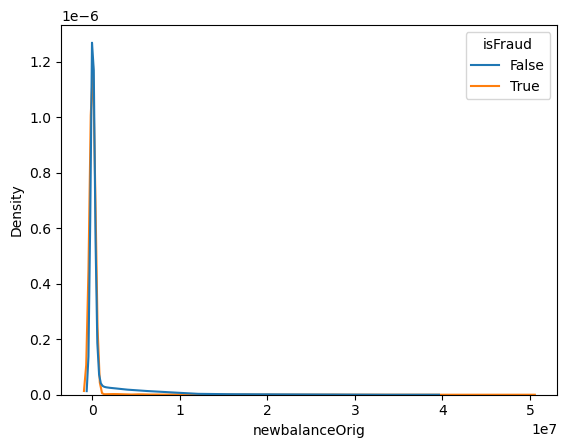

In [30]:
# oldbalanceOrg vs isFraud
sns.kdeplot(
    data=eda_df,
    x='newbalanceOrig',
    hue='isFraud',
    common_norm=False
    #log_scale=True
)

<Axes: xlabel='oldbalanceDest', ylabel='Density'>

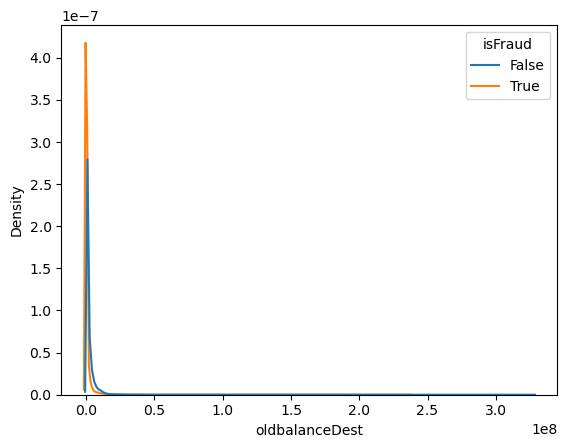

In [31]:
sns.kdeplot(
    data=eda_df,
    x='oldbalanceDest',
    hue='isFraud',
    common_norm=False
    #log_scale=True
)

<Axes: xlabel='newbalanceDest', ylabel='Density'>

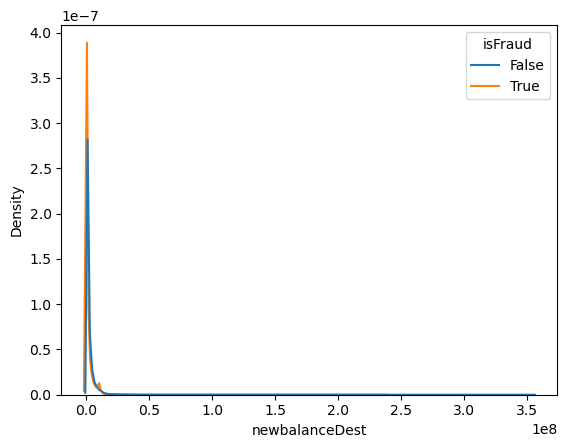

In [32]:
sns.kdeplot(
    data=eda_df,
    x='newbalanceDest',
    hue='isFraud',
    common_norm=False
    #log_scale=True
)

<Axes: >

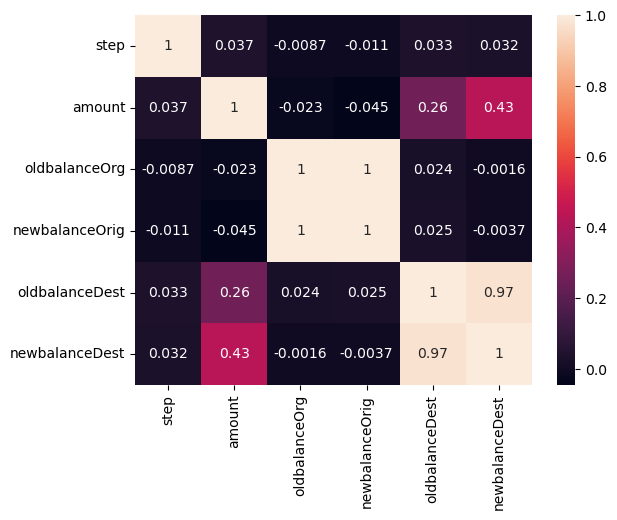

In [33]:
sns.heatmap(eda_df[num_cols].corr(),annot=True)

Insight :

oldbalanceOrg and newbalanceOrig are highly coreleted.

oldbalanceDest and newbalanceDest are also highly Correleted.

as it should be.

In [34]:
X = eda_df[num_cols]
vif = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index=X.columns)
vif.sort_values(ascending=False)

oldbalanceOrg    197.09
newbalanceOrig   197.09
newbalanceDest    73.03
oldbalanceDest    62.91
amount             3.99
step               1.29
dtype: float64

In [36]:
# Drop redundant raw balances
eda_df['diffOrig'] = eda_df['newbalanceOrig'] - eda_df['oldbalanceOrg']
eda_df['diffDest'] = eda_df['newbalanceDest'] - eda_df['oldbalanceDest']

# Drop the original highly collinear columns
eda_df = eda_df.drop(['oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest', 'newbalanceDest'], axis=1)

eda_df.head()

,step,type,amount,isFraud,isFlaggedFraud,transaction_time,diffOrig,diffDest
3091208,235,TRANSFER,"1,802,595.64",False,False,Night,"-69,511.00","1,802,595.64"
4462443,323,CASH_OUT,"300,387.02",False,False,Morning,0.00,"300,387.02"
4403902,321,CASH_OUT,"20,318.37",False,False,Morning,0.00,"20,318.37"
2577640,207,CASH_OUT,"312,938.22",False,False,Afternoon,"-8,082.00","312,938.22"
564166,22,CASH_IN,"254,030.36",False,False,Night,"254,030.36","-254,030.36"


In [37]:
# Recheck Multicolinearty
num_cols = eda_df.select_dtypes(include=[np.number]).columns.tolist()
cat_cols = [c for c in eda_df.columns if c not in num_cols]

X = eda_df[num_cols]
vif = pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])], index=X.columns)
vif.sort_values(ascending=False).head(20)

# Now Its fine.

amount     3.77
diffDest   3.37
step       1.17
diffOrig   1.09
dtype: float64

The original balance features (oldbalanceOrg, newbalanceOrig, oldbalanceDest, newbalanceDest) show very high multicollinearity, as confirmed by extremely high VIF values. This is expected because new balances are derived directly from old balances.

To remove redundancy and improve model stability, I engineered net balance change features:

diffOrig = change in sender’s balance

diffDest = change in receiver’s balance

After creating these meaningful features, the original highly correlated balance columns were dropped. This reduces multicollinearity while preserving the transactional information needed to detect fraud.

In [38]:
eda_df.head()

,step,type,amount,isFraud,isFlaggedFraud,transaction_time,diffOrig,diffDest
3091208,235,TRANSFER,"1,802,595.64",False,False,Night,"-69,511.00","1,802,595.64"
4462443,323,CASH_OUT,"300,387.02",False,False,Morning,0.00,"300,387.02"
4403902,321,CASH_OUT,"20,318.37",False,False,Morning,0.00,"20,318.37"
2577640,207,CASH_OUT,"312,938.22",False,False,Afternoon,"-8,082.00","312,938.22"
564166,22,CASH_IN,"254,030.36",False,False,Night,"254,030.36","-254,030.36"


<Axes: xlabel='diffOrig', ylabel='Density'>

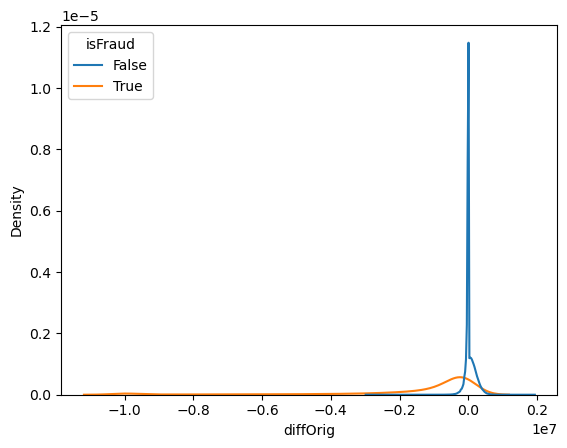

In [39]:
sns.kdeplot(
    data=eda_df,
    x='diffOrig',
    hue='isFraud',
    common_norm=False
    
)

Insight: 

Non-fraud transactions are highly concentrated around zero balance change, indicating normal transactions with small or no net impact.

Fraud transactions show much larger negetive balance changes, with a long right tail.

This pattern suggests that fraud often involves sudden and unusually large withdrawals or transfers from the sender’s account.

<Axes: xlabel='diffDest', ylabel='Density'>

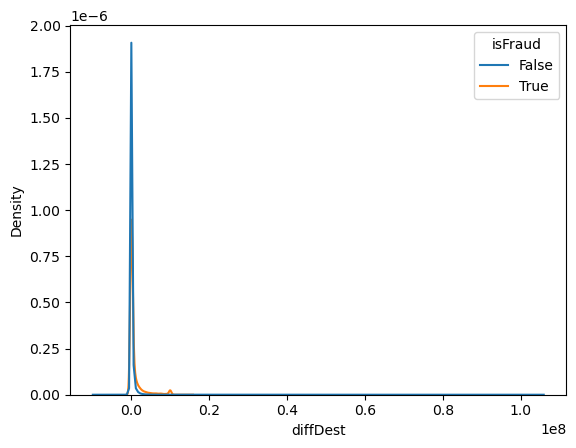

In [40]:
sns.kdeplot(
    data=eda_df,
    x='diffDest',
    hue='isFraud',
    common_norm=False
    
)

Insight :
Since fraud mainly happens via TRANSFER and CASH_OUT, and CASH_OUT does not update the receiver balance, destination balance changes look similar for fraud and non-fraud transactions.

In [41]:
eda_df['type'].value_counts()

type
CASH_OUT    564092
CASH_IN     350120
TRANSFER    136367
DEBIT        10415
Name: count, dtype: int64

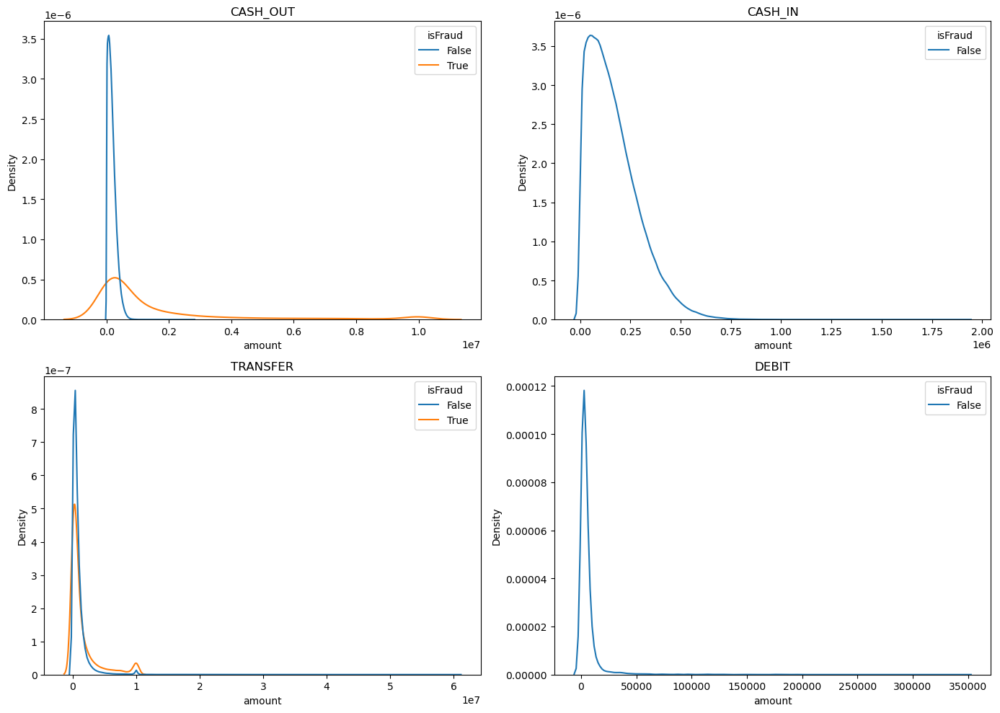

In [42]:
types = ['CASH_OUT', 'CASH_IN', 'TRANSFER', 'DEBIT']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()  # make indexing easy

for i, t in enumerate(types):
    temp = eda_df[eda_df['type'] == t]
    
    sns.kdeplot(
        data=temp,
        x='amount',
        hue='isFraud',
        common_norm=False,
        ax=axes[i]
    )
    
    axes[i].set_title(t)

plt.tight_layout()
plt.show()


Insights: Amount Distribution by Transaction Type

1️ . CASH_OUT

Fraud transactions occur at higher amounts than non-fraud.

Non-fraud is tightly concentrated near low amounts.

CASH_OUT is a high-risk transaction type.

2️ . TRANSFER

Fraud and non-fraud overlap, but fraud has a heavier right tail.

Large transfers are more common in fraud cases.

TRANSFER is the primary fraud channel.

3️ . CASH_IN

Only non-fraud transactions are present.

No fraud pattern observed.

CASH_IN is low risk.

4️ . DEBIT

Very small amounts and no fraud cases.

DEBIT is almost safe.

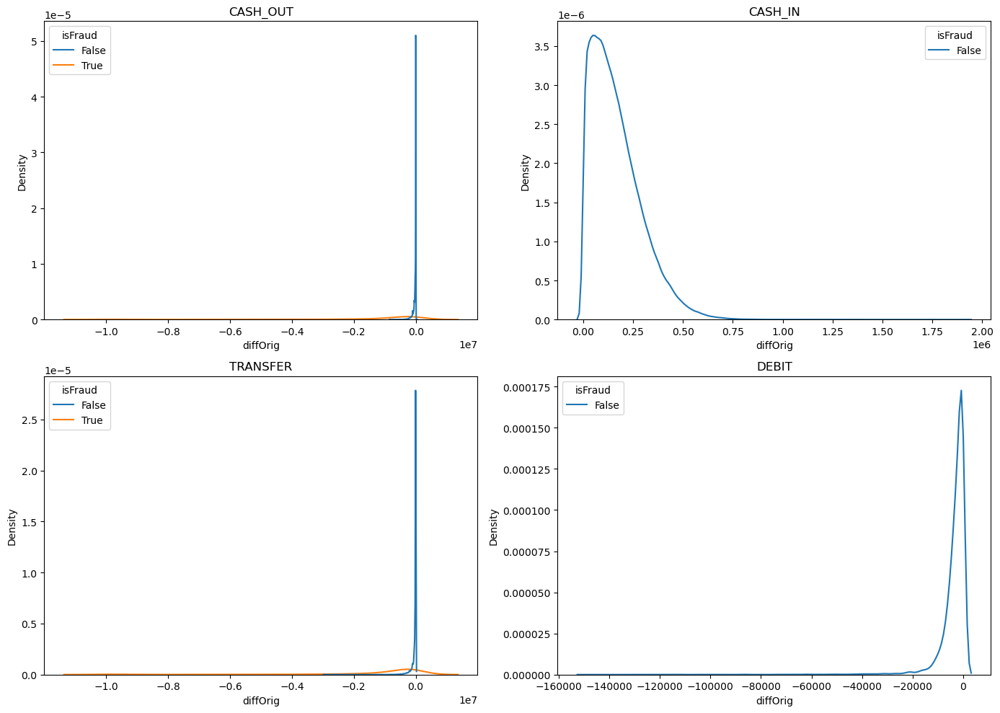

In [43]:
types = ['CASH_OUT', 'CASH_IN', 'TRANSFER', 'DEBIT']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()  # make indexing easy

for i, t in enumerate(types):
    temp = eda_df[eda_df['type'] == t]
    
    sns.kdeplot(
        data=temp,
        x='diffOrig',
        hue='isFraud',
        common_norm=False,
        ax=axes[i]
    )
    
    axes[i].set_title(t)

plt.tight_layout()
plt.show()

Insights: diffOrig (Sender Balance Change) by Transaction Type

1️ . CASH_OUT

Non-fraud transactions are concentrated very close to zero.

Fraud transactions show larger negative balance changes (money drained from sender).

Fraud CASH_OUT transactions typically empty or significantly reduce the sender’s account.

2️ . TRANSFER

Fraud transactions show larger balance reductions compared to non-fraud.

Non-fraud transfers mostly involve small balance changes.



3️ . CASH_IN

Only non-fraud transactions exist.

Sender balance increases, as expected.

CASH_IN is not associated with fraud.

4️ . DEBIT

Small balance changes with no fraud cases.

DEBIT transactions are low risk.


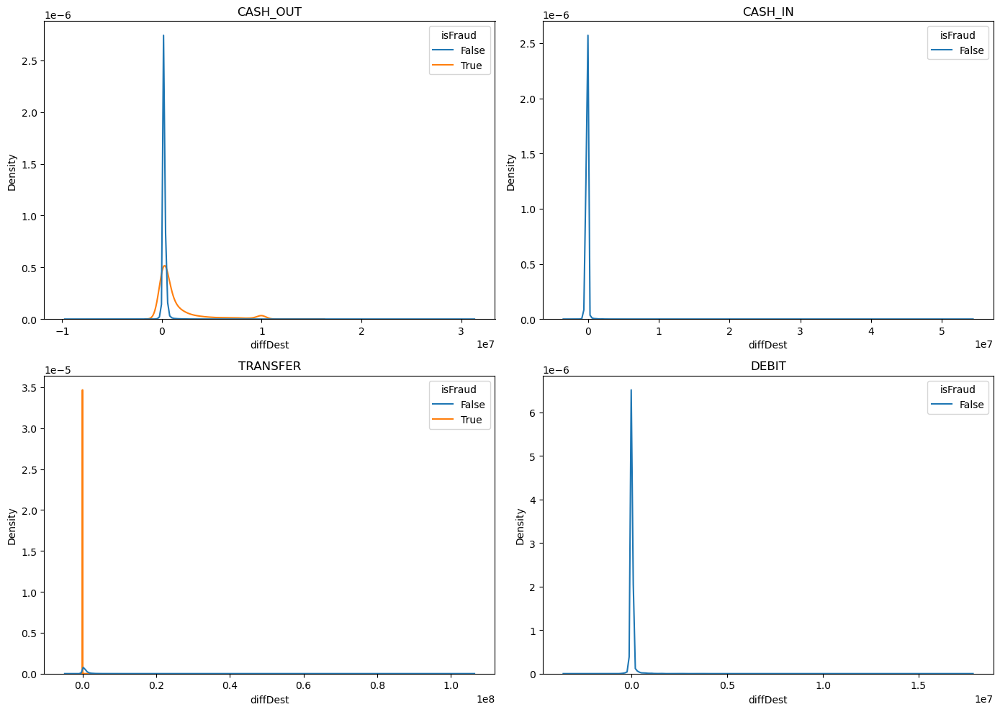

In [44]:
types = ['CASH_OUT', 'CASH_IN', 'TRANSFER', 'DEBIT']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()  # make indexing easy

for i, t in enumerate(types):
    temp = eda_df[eda_df['type'] == t]
    
    sns.kdeplot(
        data=temp,
        x='diffDest',
        hue='isFraud',
        common_norm=False,
        ax=axes[i]
    )
    
    axes[i].set_title(t)

plt.tight_layout()
plt.show()

# Model

### 1.Measure baseline strategy that was whenever a transaction amount is greater then 2 lack it will consider as fraud.


In [61]:
eda_df[['isFraud','isFlaggedFraud']] = eda_df[['isFraud','isFlaggedFraud']].astype('int')

In [62]:
print(classification_report(eda_df['isFraud'],eda_df['isFlaggedFraud']))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00   1052781
           1       1.00      0.00      0.00      8213

    accuracy                           0.99   1060994
   macro avg       1.00      0.50      0.50   1060994
weighted avg       0.99      0.99      0.99   1060994



The model accuracy is around 99%, which does not reflect the complete performance due to severe class imbalance. The high accuracy is mainly driven by the large number of non-fraud transactions. The precision is also high (99%), indicating that the model rarely misclassifies genuine transactions as fraud, which is not a major concern. However, the recall is 0%, meaning the model fails to detect fraudulent transactions. This inability to identify fraud is the key problem, making the current strategy ineffective and requiring significant improvement.

### 2. Data Preparation
we will use this eda_df sample dataset for model selection , tuning , feature selection and interepreting results and use full data to model training.

In [63]:
eda_df.head()

,step,type,amount,isFraud,isFlaggedFraud,transaction_time,diffOrig,diffDest
625802,34,TRANSFER,"351,035.54",0,0,Morning,0.00,"770,938.21"
5748008,399,CASH_IN,"35,254.69",0,0,Afternoon,"-35,254.69",0.00
2195592,185,TRANSFER,"1,652,314.64",0,0,Afternoon,0.00,"1,281,862.67"
613323,34,CASH_IN,"221,597.94",0,0,Morning,"-221,597.94","-221,597.94"
2013998,180,CASH_IN,"410,318.43",0,0,Afternoon,"-410,318.43","-410,318.44"


In [64]:
# drop isFlaggedFraud
eda_df.drop(columns=['isFlaggedFraud','step'],inplace=True)

In [65]:
# keeping the same distribution of fraud in train and validation data
train,val = train_test_split(eda_df,stratify=eda_df['isFraud'],test_size=0.1)

In [68]:
train.shape

(954894, 6)

In [69]:
train['isFraud'].value_counts()/len(train)

isFraud
0   0.99
1   0.01
Name: count, dtype: float64

In [70]:
val.shape

(106100, 6)

In [71]:
val['isFraud'].value_counts()/len(val)

isFraud
0   0.99
1   0.01
Name: count, dtype: float64

In [72]:
# Save Validation data
val.to_csv('validation_set.csv',index=False)

In [73]:
# train and test data
x,y = train.drop(columns=['isFraud']),train['isFraud']
x_train,x_test,y_train,y_test = train_test_split(x,y,random_state=42,test_size=0.2)

In [74]:
y_train.value_counts()/len(y_train)

isFraud
0   0.99
1   0.01
Name: count, dtype: float64

In [75]:
y_test.value_counts()/len(y_test)

isFraud
0   0.99
1   0.01
Name: count, dtype: float64

### 3. Model Selection
Approach: Due to class imbalance, accuracy is misleading; therefore, we will rely on three metrics: precision, recall, and F1-score.

In [76]:
# Linear Models
from sklearn.linear_model import LogisticRegression, SGDClassifier

# Distance-Based
from sklearn.neighbors import KNeighborsClassifier

# Tree-Based
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
    GradientBoostingClassifier,
    AdaBoostClassifier,
    BaggingClassifier,
    VotingClassifier
)

# Support Vector Machines
from sklearn.svm import SVC

# Probabilistic Models
from sklearn.naive_bayes import GaussianNB, BernoulliNB

# boosting
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [77]:
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    # "SGD Classifier": SGDClassifier(),
    "KNN": KNeighborsClassifier(),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1),
    "Extra Trees": ExtraTreesClassifier(n_estimators=100, random_state=42, n_jobs=-1),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "AdaBoost": AdaBoostClassifier(random_state=42),
    "Bagging": BaggingClassifier(random_state=42),
    "SVM (RBF)": SVC(probability=True),
    "Gaussian NB": GaussianNB(),
    "Bernoulli NB": BernoulliNB()
}


In [78]:
# Column transformer
preprocessor = ColumnTransformer(transformers=[
                                              ('num',StandardScaler(),['amount','diffOrig','diffDest']),
                                              ('cat',OneHotEncoder(),['type','transaction_time',])
                                              ])

In [79]:
# model training pipeline
with open("model_selection_report.txt", "w") as f:
    for name, model in models.items():
        
        pipeline = Pipeline([
            ('preprocessing', preprocessor),
            ('sampling', RandomUnderSampler(random_state=42)),
            ('model', model)
        ])
        
        pipeline.fit(x_train, y_train)
        y_pred = pipeline.predict(x_test)
        
        f.write(f"\n{'='*50}\n")
        f.write(f"{name} Performance\n")
        f.write(f"{'='*50}\n")
        
        report = classification_report(y_test, y_pred)
        print(f"{name} Performance")
        print(report)
        f.write(report)
        f.write("\n")
 
    
       
    

Logistic Regression Performance
              precision    recall  f1-score   support

           0       1.00      0.95      0.98    189562
           1       0.12      0.91      0.22      1417

    accuracy                           0.95    190979
   macro avg       0.56      0.93      0.60    190979
weighted avg       0.99      0.95      0.97    190979

KNN Performance
              precision    recall  f1-score   support

           0       1.00      0.94      0.97    189562
           1       0.11      0.97      0.19      1417

    accuracy                           0.94    190979
   macro avg       0.55      0.96      0.58    190979
weighted avg       0.99      0.94      0.96    190979

Decision Tree Performance
              precision    recall  f1-score   support

           0       1.00      0.95      0.97    189562
           1       0.12      0.96      0.22      1417

    accuracy                           0.95    190979
   macro avg       0.56      0.95      0.60    190979


## All models show high recall, which means they are able to detect most fraudulent transactions. However, the precision is low, indicating that many genuine transactions are being incorrectly classified as fraud (false positives). This happens because the models currently classify a transaction as fraud when the predicted probability is greater than or equal to 0.5. Since false positives are high, the current decision threshold is too low. To address this, we will increase the probability threshold required to classify a transaction as fraud. By selecting an optimal threshold, we aim to reduce false positives while maintaining a reasonable recall, thereby improving overall model performance.

Logistic Regression Performance on best thresold value : 0.9968814654145814
 

        
        Precision   :  0.8392116182572614 
        Recall      :  0.570924488355681
        F1-Score    :  0.6795464090713366
        
        


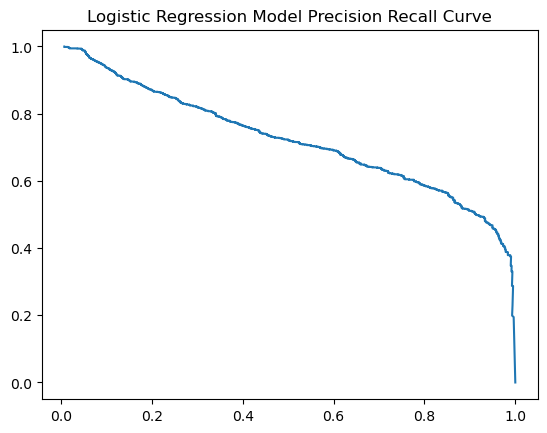

KNN Performance on best thresold value : 1.0
 

        
        Precision   :  0.2764640883977901 
        Recall      :  0.8828510938602682
        F1-Score    :  0.42107034668425475
        
        


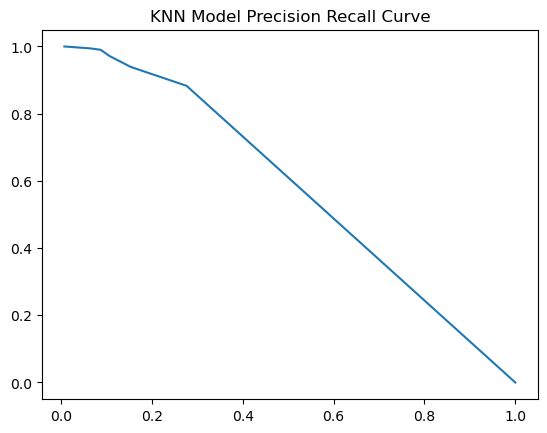

Decision Tree Performance on best thresold value : 1.0
 

        
        Precision   :  0.12276886835190721 
        Recall      :  0.9562455892731122
        F1-Score    :  0.2176007708364773
        
        


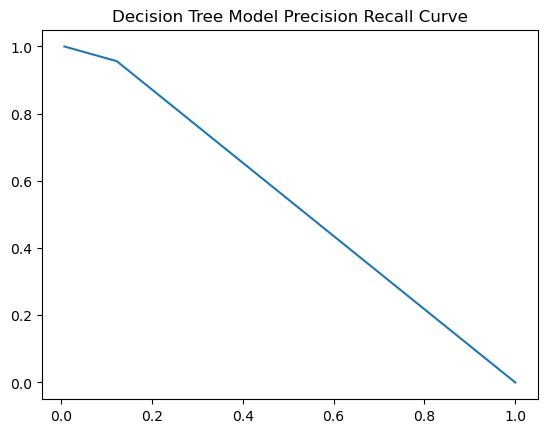

Random Forest Performance on best thresold value : 1.0
 

        
        Precision   :  0.5852713178294574 
        Recall      :  0.7459421312632322
        F1-Score    :  0.6559106422582723
        
        


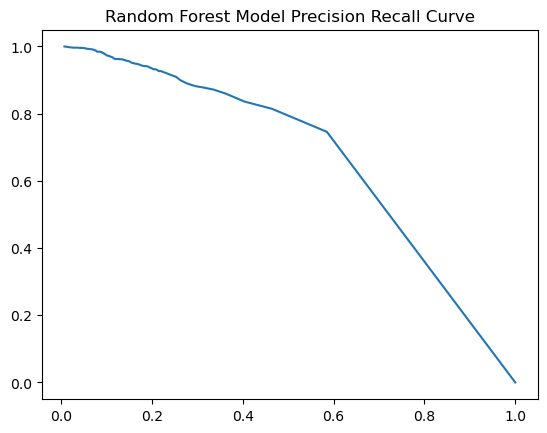

Extra Trees Performance on best thresold value : 1.0
 

        
        Precision   :  0.36389324960753533 
        Recall      :  0.817925194071983
        F1-Score    :  0.5036940460665013
        
        


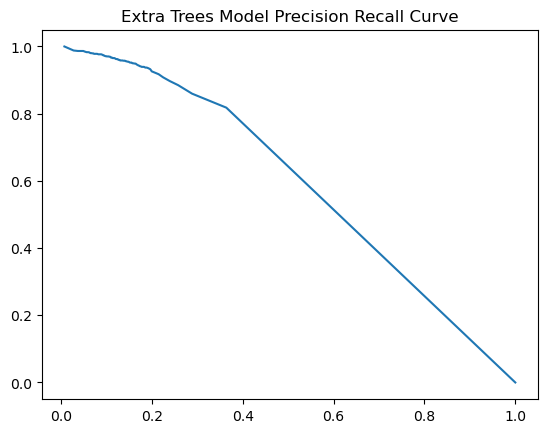

Gradient Boosting Performance on best thresold value : 0.9562041976692726
 

        
        Precision   :  0.8763955342902712 
        Recall      :  0.7755822159491884
        F1-Score    :  0.8229127667535265
        
        


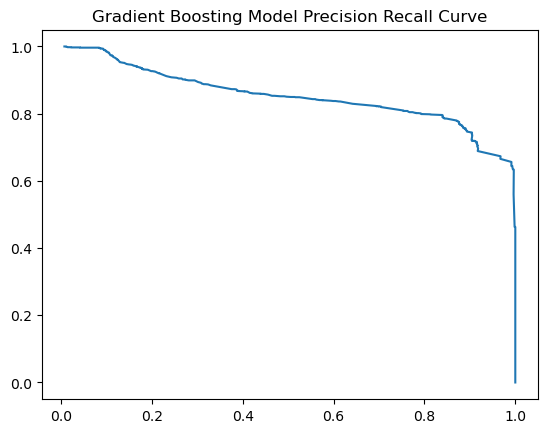

AdaBoost Performance on best thresold value : 0.634463928071436
 

        
        Precision   :  0.9315206445115811 
        Recall      :  0.652787579393084
        F1-Score    :  0.7676348547712997
        
        


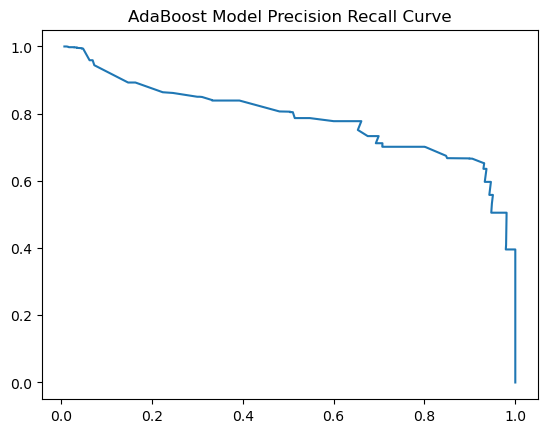

Bagging Performance on best thresold value : 1.0
 

        
        Precision   :  0.292268281322776 
        Recall      :  0.8856739590684545
        F1-Score    :  0.4395027140602117
        
        


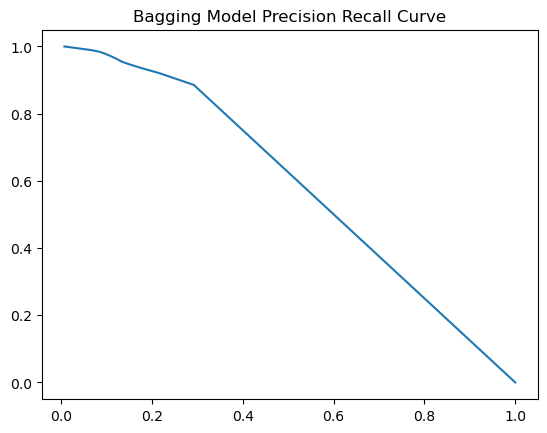

SVM (RBF) Performance on best thresold value : 0.9958628209458839
 

        
        Precision   :  0.6640776699029126 
        Recall      :  0.4827099505998589
        F1-Score    :  0.5590519002855769
        
        


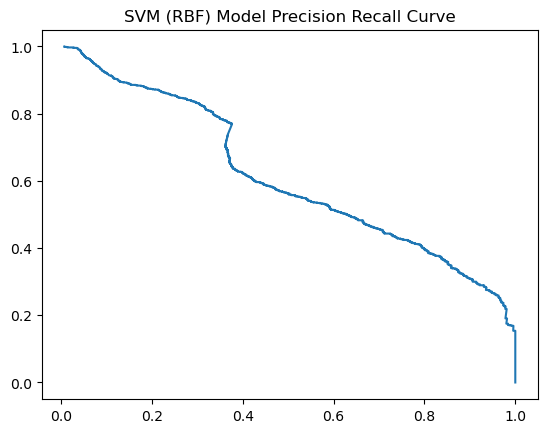

Gaussian NB Performance on best thresold value : 1.0
 

        
        Precision   :  0.31939655172413794 
        Recall      :  0.5229357798165137
        F1-Score    :  0.3965747926139258
        
        


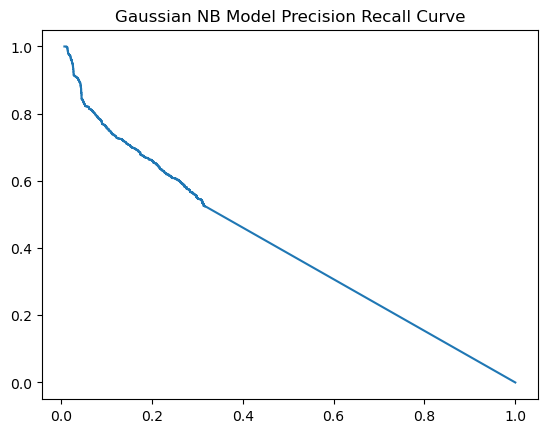

Bernoulli NB Performance on best thresold value : 0.9899459086044909
 

        
        Precision   :  0.3468414779499404 
        Recall      :  0.205363443895554
        F1-Score    :  0.25797872340378813
        
        


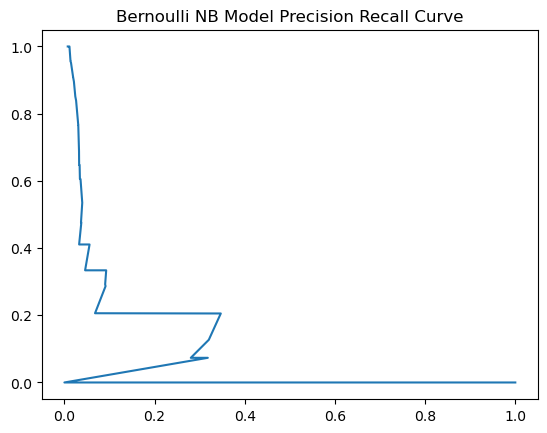

In [81]:
# model training with optimal thresold
with open("model_selection_report_with_thresold.txt", "w") as f:
    for name, model in models.items():
        
        pipeline = Pipeline([
            ('preprocessing', preprocessor),
            ('sampling', RandomUnderSampler(random_state=42)),
            ('model', model)
        ])
        
        pipeline.fit(x_train, y_train)
        y_prob = pipeline.predict_proba(x_test)[:,1]

        # calculate precision and recall with thresolds
        precision,recall,pr_thresold = precision_recall_curve(y_test,y_prob)

        # calculate f1 score
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-12)

        # select best thresold based on f1 score
        best_idx = np.nanargmax(f1_scores[:-1]) # exclude last element as it corresponds to threshold=none
        best_threshold = pr_thresold[best_idx]

        # select precision , recall , f1score on best thresold
        best_precision = precision[best_idx]
        best_recall = recall[best_idx]
        best_f1 = f1_scores[best_idx]

        # plot precision recall curve
                
        
        f.write(f"\n{'='*50}\n")
        f.write(f"{name} Performance on best thresold value : {best_threshold}\n")
        f.write(f"{'='*50}\n")

        sstr = f"""
        
        Precision   :  {best_precision} 
        Recall      :  {best_recall}
        F1-Score    :  {best_f1}
        
        """
        
        print(f"{name} Performance on best thresold value : {best_threshold}\n ")
        print(sstr)
        plt.plot(precision,recall)
        plt.title(f"{name} Model Precision Recall Curve")
        plt.show()

        
        f.write(sstr)
        f.write("\n")

### After threshold optimization, Gradient Boosting and AdaBoost emerged as the best-performing models. Both models achieved high precision (~93–94%) while maintaining reasonable recall, resulting in strong F1-scores. This indicates that these models effectively balance fraud detection with a reduced number of false positives. Compared to other models, they provide the most reliable trade-off between catching fraudulent transactions and minimizing incorrect fraud alerts.

### lets try xgboost and lgbm

XGB Performance on best thresold value : 0.9978935122489929
 

        
        Precision   :  0.936550491510277 
        Recall      :  0.739590684544813
        F1-Score    :  0.8264984227124408
        
        


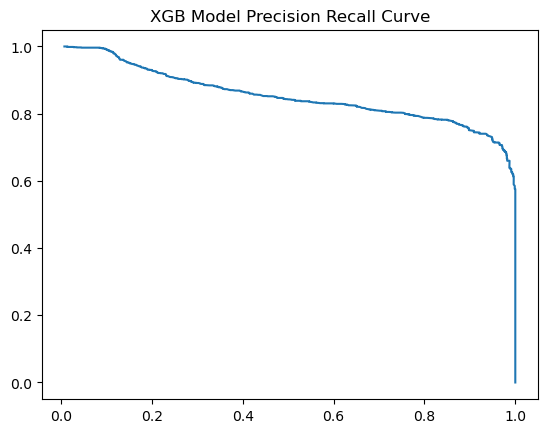

[LightGBM] [Info] Number of positive: 5975, number of negative: 5975
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001459 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 11950, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


LGBM Performance on best thresold value : 0.9985605867166345
 

        
        Precision   :  0.934841628959276 
        Recall      :  0.7290049400141143
        F1-Score    :  0.8191911181596979
        
        


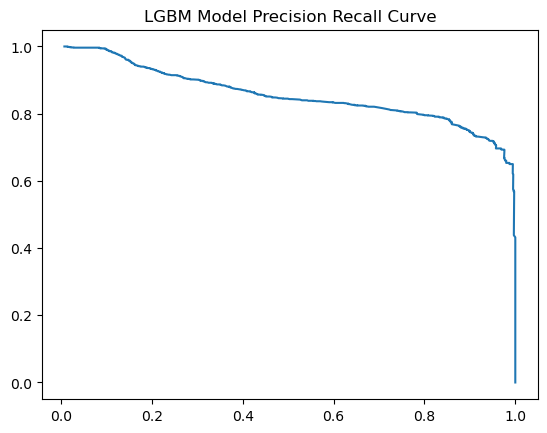

In [82]:
# xgboost and lightgbm training with optimal thresold
with open("model_selection_report_with_thresold.txt", "a") as f:
    
    
    new_models = {'XGB':XGBClassifier(eval_metric='logloss',random_state=42),'LGBM':LGBMClassifier(random_state=42)}
    for name, model in new_models.items():
        
        rus = RandomUnderSampler(random_state=42)
        X_train_res, y_train_res = rus.fit_resample(x_train, y_train)

        X_train_res_prep = preprocessor.fit_transform(X_train_res)
        X_test_prep = preprocessor.transform(x_test)

        model.fit(X_train_res_prep, y_train_res)
        
        y_prob = model.predict_proba(X_test_prep)[:,1]

        # calculate precision and recall with thresolds
        precision,recall,pr_thresold = precision_recall_curve(y_test,y_prob)

        # calculate f1 score
        f1_scores = 2 * (precision * recall) / (precision + recall + 1e-12)

        # select best thresold based on f1 score
        best_idx = np.nanargmax(f1_scores[:-1]) # exclude last element as it corresponds to threshold=none
        best_threshold = pr_thresold[best_idx]

        # select precision , recall , f1score on best thresold
        best_precision = precision[best_idx]
        best_recall = recall[best_idx]
        best_f1 = f1_scores[best_idx]

        # plot precision recall curve
                
        
        f.write(f"\n{'='*50}\n")
        f.write(f"{name} Performance on best thresold value : {best_threshold}\n")
        f.write(f"{'='*50}\n")

        sstr = f"""
        
        Precision   :  {best_precision} 
        Recall      :  {best_recall}
        F1-Score    :  {best_f1}
        
        """
        
        print(f"{name} Performance on best thresold value : {best_threshold}\n ")
        print(sstr)
        plt.plot(precision,recall)
        plt.title(f"{name} Model Precision Recall Curve")
        plt.show()

        
        f.write(sstr)
        f.write("\n")

### The results clearly show that XGBoost and LightGBM outperform Gradient Boosting and AdaBoost after threshold optimization. Both models achieve higher F1-scores while maintaining very high precision and reasonable recall, indicating a better balance between detecting fraud and reducing false positives. This confirms that advanced boosting-based models are particularly well suited for this fraud detection problem, as they effectively capture complex, non-linear patterns in highly imbalanced data.

### Since XGBoost and LightGBM show comparable performance, LightGBM is selected as the final model due to its faster training, lower memory consumption, and better scalability for large tabular datasets, while XGBoost is retained as a backup model.

-> Primary model: LightGBM

-> Backup model: XGBoost

-> Decision threshold: Custom (not 0.5)

-> Evaluation focus: Precision, Recall, F1-score

# 4. Model Tunning (LGBM) With Optimal Thresold

# Exp. 1

In [82]:
def objective(trial):
  # Define Parameters
  params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'num_leaves': trial.suggest_int('num_leaves', 20, 120),
        'max_depth': trial.suggest_int('max_depth', -1, 15),
        'min_child_samples':  trial.suggest_int('min_child_samples', 10, 100),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
        'n_estimators': trial.suggest_int('n_estimators',100,2000,step=100),
        'n_jobs': -1,
        'random_state': 42,
        'is_unbalance': True
    }

  # Column transformer
  preprocessor = ColumnTransformer(transformers=[
                                              ('num',StandardScaler(),['amount','diffOrig','diffDest']),
                                              ('cat',OneHotEncoder(),['type'])
                                              ])


  # create model
  lgbm = LGBMClassifier(**params)
  pipeline = Pipeline([
      ('preprocessing',preprocessor),
      ('sampling',RandomUnderSampler()),
      ('model',lgbm)
  ])

  cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

  y_pred_proba = cross_val_predict(pipeline,x_train,y_train,cv=cv,method='predict_proba',n_jobs=-1)[:,1]
  y_pred = (y_pred_proba>0.99).astype('int')
  f1 = f1_score(y_train,y_pred)
  return f1

In [83]:
study = optuna.create_study(direction='maximize')
study.optimize(objective,n_trials=100,show_progress_bar=True)

[I 2026-01-02 20:15:13,745] A new study created in memory with name: no-name-9aa81fab-c2fc-4a75-b90c-b310718cf46f


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2026-01-02 20:15:31,720] Trial 0 finished with value: 0.8231152830742153 and parameters: {'learning_rate': 0.0317277663814302, 'num_leaves': 96, 'max_depth': 10, 'min_child_samples': 99, 'subsample': 0.5254694518795492, 'colsample_bytree': 0.6272736893027547, 'reg_alpha': 4.636136824800643, 'reg_lambda': 1.0775103700853057, 'n_estimators': 800}. Best is trial 0 with value: 0.8231152830742153.
[I 2026-01-02 20:15:45,738] Trial 1 finished with value: 0.8091617563200912 and parameters: {'learning_rate': 0.12349131942909068, 'num_leaves': 31, 'max_depth': 14, 'min_child_samples': 23, 'subsample': 0.13326896457780477, 'colsample_bytree': 0.5577788202305104, 'reg_alpha': 1.392231390944083, 'reg_lambda': 0.34159405080996297, 'n_estimators': 1000}. Best is trial 0 with value: 0.8231152830742153.
[I 2026-01-02 20:15:57,585] Trial 2 finished with value: 0.8069262336102492 and parameters: {'learning_rate': 0.19928604676101044, 'num_leaves': 118, 'max_depth': 15, 'min_child_samples': 22, 'subsa

In [84]:
print(study.best_params)
print(study.best_value)

{'learning_rate': 0.10670374567265198, 'num_leaves': 81, 'max_depth': 0, 'min_child_samples': 70, 'subsample': 0.5600673388297879, 'colsample_bytree': 0.7871962305034367, 'reg_alpha': 2.4676042691501707, 'reg_lambda': 1.0767895584470177, 'n_estimators': 1000}
0.8288165334373172


### Even After 100 trails F1-score not seem good.

# Exp . 2 with Outlier treatment

In [158]:
# df.head()
# df['diffOrg'] = df['oldbalanceOrg'] - df['newbalanceOrig']
# df['diffdest'] = df['oldbalanceDest'] - df['newbalanceDest']
# df['isFraud'] = df['isFraud'].astype('int')
# df.drop(columns=['oldbalanceOrg','newbalanceOrig','newbalanceDest','oldbalanceDest','isFlaggedFraud'],inplace=True)
# train,val = train_test_split(df,stratify=df['isFraud'],test_size=0.1)
# train.shape,val.shape

((3790012, 5), (421113, 5))

In [160]:
# val.to_csv('validation_data.csv',index=False)

In [161]:
# x,y = train.drop(columns=['isFraud']),train['isFraud']
# x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [164]:
# x_train.shape,x_test.shape,y_train.shape,y_test.shape

((3032009, 4), (758003, 4), (3032009,), (758003,))

In [163]:
# x_train.head()
# x_train1 , x_test1 = x_train.copy(),x_test.copy()
# x_train1['amount_diff_ration'] = x_train1['diffOrig']/x_train1['amount']
# x_train1['large_transaction'] = (x_train1['amount']>200000).astype('int')

# x_test1['amount_diff_ration'] = x_test1['diffOrig']/x_test1['amount']
# x_test1['large_transaction'] = (x_test1['amount']>200000).astype('int')

# x_test1.head()

In [139]:
def objective(trial):
  # Define Parameters
  params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'num_leaves': trial.suggest_int('num_leaves', 20, 120),
        'max_depth': trial.suggest_int('max_depth', -1, 15),
        'min_child_samples':  trial.suggest_int('min_child_samples', 10, 100),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
        'n_estimators': trial.suggest_int('n_estimators',100,1000,step=100),
        'n_jobs': -1,
        'random_state': 42,
        'is_unbalance': True
    }

  # Column transformer
  preprocessor = ColumnTransformer(transformers=[
                                              ('num',StandardScaler(),['amount','diffOrig','diffDest']),
                                              ('cat',OneHotEncoder(),['type','transaction_time'])
                                              ])


  # create model
  lgbm = LGBMClassifier(**params)
  pipeline = Pipeline([
      ('preprocessing',preprocessor),
      ('sampling',RandomUnderSampler()),
      ('model',lgbm)
  ])

  cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

  y_pred_proba = cross_val_predict(pipeline,X_final,y_final,cv=cv,method='predict_proba',n_jobs=-1)[:,1]
  y_pred = (y_pred_proba>0.99).astype('int')
  f1 = f1_score(y_final,y_pred)
  return f1

In [138]:
X_final.shape,y_final.shape

((604137, 5), (604137,))

In [140]:
study = optuna.create_study(direction='maximize')
study.optimize(objective,n_trials=25,show_progress_bar=True)

[I 2026-01-03 11:58:21,949] A new study created in memory with name: no-name-1c7616dd-63c3-43b7-974b-9f2ffb970ead


  0%|          | 0/25 [00:00<?, ?it/s]

[I 2026-01-03 11:58:35,352] Trial 0 finished with value: 0.9164606146238078 and parameters: {'learning_rate': 0.09676376758165996, 'num_leaves': 86, 'max_depth': 4, 'min_child_samples': 25, 'subsample': 0.40160593733962957, 'colsample_bytree': 0.8114662485686555, 'reg_alpha': 0.41279730390862135, 'reg_lambda': 4.898646780368749, 'n_estimators': 400}. Best is trial 0 with value: 0.9164606146238078.
[I 2026-01-03 11:58:46,705] Trial 1 finished with value: 0.7646025018091596 and parameters: {'learning_rate': 0.028208994958571633, 'num_leaves': 20, 'max_depth': 3, 'min_child_samples': 60, 'subsample': 0.5184128057005393, 'colsample_bytree': 0.5927642130166288, 'reg_alpha': 2.230851963818295, 'reg_lambda': 1.463447310996016, 'n_estimators': 200}. Best is trial 0 with value: 0.9164606146238078.
[I 2026-01-03 11:58:57,524] Trial 2 finished with value: 0.824744295830055 and parameters: {'learning_rate': 0.08136736403479318, 'num_leaves': 43, 'max_depth': 2, 'min_child_samples': 41, 'subsample'

In [141]:
print(study.best_params)
print(study.best_value)

{'learning_rate': 0.05098082456932761, 'num_leaves': 75, 'max_depth': 12, 'min_child_samples': 86, 'subsample': 0.5730289947772194, 'colsample_bytree': 0.7206709329069798, 'reg_alpha': 0.9381056895506075, 'reg_lambda': 2.024305991120048, 'n_estimators': 600}
0.9233511586452763


In [142]:
# Column transformer
preprocessor = ColumnTransformer(transformers=[
                                              ('num',StandardScaler(),['amount','diffOrig','diffDest']),
                                              ('cat',OneHotEncoder(),['type','transaction_time'])
                                              ])
best_params = study.best_params
lgbm = LGBMClassifier(**best_params)
pipeline = Pipeline([
      ('preprocessing',preprocessor),
      ('sampling',RandomUnderSampler()),
      ('model',lgbm)
  ])
pipeline.fit(X_final,y_final)
y_pred = pipeline.predict(x_test)
print(classification_report(y_test,y_pred))

[LightGBM] [Info] Number of positive: 5975, number of negative: 5975
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000431 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 11950, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


              precision    recall  f1-score   support

           0       1.00      0.90      0.94    189562
           1       0.06      0.97      0.12      1417

    accuracy                           0.90    190979
   macro avg       0.53      0.93      0.53    190979
weighted avg       0.99      0.90      0.94    190979



In [143]:
y_prob = pipeline.predict_proba(x_test)[:,1]

precision,recall,pr_thresold = precision_recall_curve(y_test,y_prob)
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-12)
best_idx = np.nanargmax(f1_scores[:-1]) # exclude last element as it corresponds to threshold=none
best_threshold = pr_thresold[best_idx]
best_precision = precision[best_idx]
best_recall = recall[best_idx]
best_f1 = f1_scores[best_idx]
print(f"Best threshold by F1: {best_threshold:.4f}")
print(f"Precision={best_precision:.4f}, Recall={best_recall:.4f}, F1={best_f1:.4f}")

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Best threshold by F1: 0.9999
Precision=0.7214, Recall=0.5794, F1=0.6427


In [117]:
pipeline.fit(x_train,y_train)
y_pred = pipeline.predict(x_test)
accuracy_score(y_test,y_pred)

[LightGBM] [Info] Number of positive: 5923, number of negative: 5923
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000493 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 773
[LightGBM] [Info] Number of data points in the train set: 11846, number of used features: 7
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


0.9421559438472292

# Outlier treatment

In [99]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((763915, 5), (190979, 5), (763915,), (190979,))

In [112]:
idx = y_train[y_train == 0].index
temp_x_train = x_train.loc[idx,:]
temp_y_train = y_train.copy()
temp_x_train

,type,amount,transaction_time,diffOrig,diffDest
4516587,CASH_OUT,"2,833.93",Afternoon,"1,140.00","2,833.93"
2154040,CASH_IN,"311,109.73",Afternoon,"-311,109.72","-311,109.72"
4419035,CASH_OUT,"286,035.68",Morning,0.00,"286,035.68"
662058,CASH_OUT,"548,752.35",Afternoon,"1,219.00","548,752.35"
4533256,CASH_OUT,"187,984.20",Afternoon,256.00,"187,984.20"
...,...,...,...,...,...
3654049,CASH_OUT,"79,233.33",Morning,0.00,"79,233.33"
2752627,TRANSFER,"660,667.78",Night,"11,489.00","660,667.78"
942814,CASH_OUT,"16,148.62",Night,341.00,"45,623.83"
3565317,CASH_OUT,"242,415.86",Night,"30,691.00","242,415.87"


In [119]:
# i will Not drop fraud rows whether it is outlier
# df3 = df2[df2['isFraud']==0]
# df4 = df2[df2['isFraud']==1]
cols = ['amount','diffOrig','diffDest']
before = temp_x_train.shape[0]
for col in cols:
    Q1 = temp_x_train[col].quantile(0.25)
    Q3 = temp_x_train[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR


    print(f"Before Shape : {before}")

    idx = temp_x_train[(temp_x_train[col] >= lower_bound) & (temp_x_train[col] <= upper_bound)].index
    temp_x_train = temp_x_train.loc[idx,:]
    temp_y_train = temp_y_train.loc[idx]
    
    after = temp_x_train.shape[0]
    print(f"After Shape : {after}")
    print(f"{col}: Removed {before - after} outliers")
    before = after

Before Shape : 700557
After Shape : 697998
amount: Removed 2559 outliers
Before Shape : 697998
After Shape : 609646
diffOrig: Removed 88352 outliers
Before Shape : 609646
After Shape : 598162
diffDest: Removed 11484 outliers


In [124]:
print(temp_x_train.shape,temp_y_train.shape)
idx = y_train[y_train==1].index
x_temp = x_train.loc[idx,:]
y_temp = y_train.loc[idx]


X_final = pd.concat([temp_x_train, x_temp], axis=0)
y_final = pd.concat([temp_y_train, y_temp], axis=0)
X_final, y_final = shuffle(
    X_final,
    y_final,
    random_state=42
)
X_final.shape,y_final.shape


(598162, 5) (598162,)


((604137, 5), (604137,))

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()  # make indexing easy

for i, t in enumerate(types):
    temp = eda_df[eda_df['type'] == t]
    
    sns.kdeplot(
        data=temp,
        x='amount',
        hue='isFraud',
        common_norm=False,
        ax=axes[i]
    )
    
    axes[i].set_title(t)

plt.tight_layout()
plt.show()


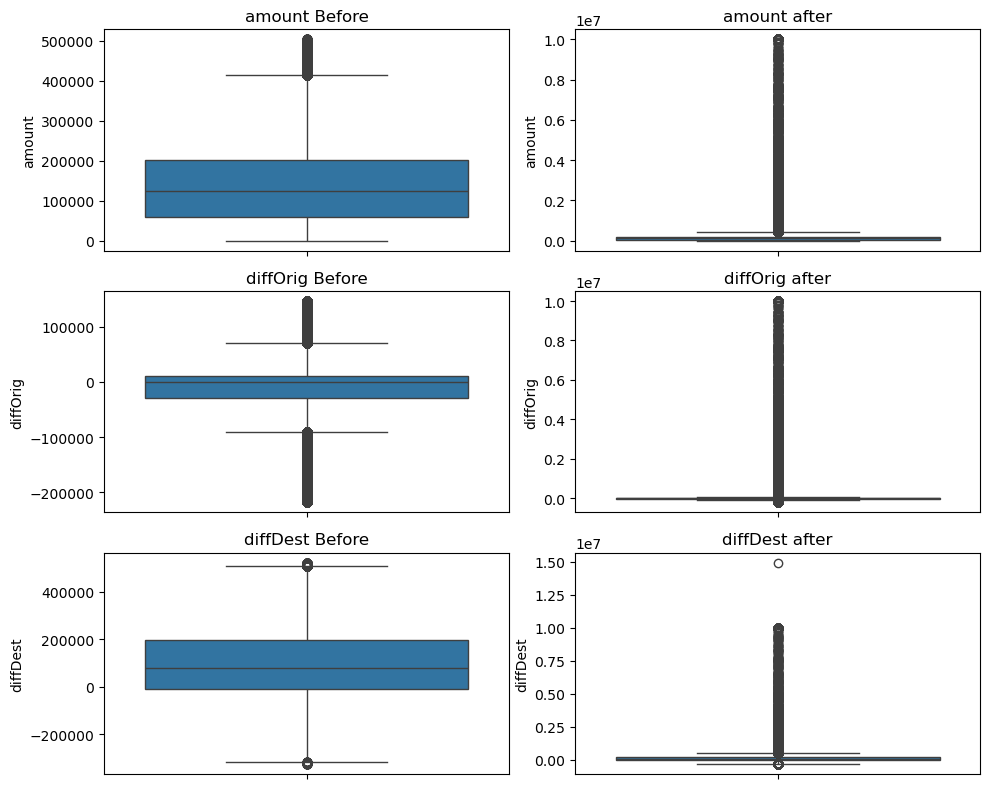

In [129]:
numeric = ['amount','diffOrig','diffDest']
fig,axes = plt.subplots(3,2,figsize=(10,8))

for i in range(len(numeric)):
    sns.boxplot(temp_x_train[numeric[i]],ax=axes[i,0])
    sns.boxplot(X_final[numeric[i]],ax=axes[i,1])
    axes[i,0].set_title(f"{numeric[i]} Before")
    axes[i,1].set_title(f"{numeric[i]} after")
    
plt.tight_layout()
plt.show()

Before:
The data contains only non-fraud transactions, and we observe very few outliers.

After:
Even after performing outlier treatment on non-fraud data, once we add fraud transactions back, we see many extreme values in amount, diffOrig, and diffDest.

This clearly indicates that fraud transactions themselves behave like outliers

# Trail 3 (log transform)

In [149]:
log_transformer = FunctionTransformer(
    lambda x: np.log1p(np.abs(x)),
    feature_names_out="one-to-one"
)

In [159]:
def objective(trial):
  # Define Parameters
  params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'num_leaves': trial.suggest_int('num_leaves', 20, 120),
        'max_depth': trial.suggest_int('max_depth', -1, 15),
        'min_child_samples':  trial.suggest_int('min_child_samples', 10, 100),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
        'n_estimators': trial.suggest_int('n_estimators',100,1000,step=100),
        'n_jobs': -1,
        'random_state': 42,
        'is_unbalance': True
    }

  log_transformer = FunctionTransformer(
    lambda x: np.log1p(np.abs(x)),
    feature_names_out="one-to-one"
    )

  # Column transformer
  preprocessor = ColumnTransformer(transformers=[
                                              ('num',log_transformer,['amount','diffOrig','diffDest']),
                                              ('cat',OneHotEncoder(),['type','transaction_time'])
                                              ])


  # create model
  lgbm = LGBMClassifier(**params)
  pipeline = Pipeline([
      ('preprocessing',preprocessor),
      ('sampling',RandomUnderSampler()),
      ('model',lgbm)
  ])

  cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

  y_pred_proba = cross_val_predict(pipeline,x_train,y_train,cv=cv,method='predict_proba')[:,1]
  y_pred = (y_pred_proba>0.99).astype('int')
  f1 = f1_score(y_train,y_pred)
  return f1

In [158]:
study = optuna.create_study(direction='maximize')
study.optimize(objective,n_trials=25,show_progress_bar=False)

[I 2026-01-03 13:54:21,643] A new study created in memory with name: no-name-ea901392-08b9-4435-abb4-9a259eda0c6e


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000573 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:54:29,089] Trial 0 finished with value: 0.8401182190866622 and parameters: {'learning_rate': 0.09880177581821213, 'num_leaves': 57, 'max_depth': 12, 'min_child_samples': 69, 'subsample': 0.9499544938342, 'colsample_bytree': 0.802153032880225, 'reg_alpha': 1.7454057515295618, 'reg_lambda': 3.22391608571079, 'n_estimators': 300}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000824 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:54:34,435] Trial 1 finished with value: 0.8217160808953465 and parameters: {'learning_rate': 0.18320891815506937, 'num_leaves': 92, 'max_depth': 9, 'min_child_samples': 47, 'subsample': 0.648305728462731, 'colsample_bytree': 0.3034239868020069, 'reg_alpha': 2.8278210379436484, 'reg_lambda': 3.9145122554119234, 'n_estimators': 200}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000609 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000653 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:54:38,968] Trial 2 finished with value: 0.8316831683168316 and parameters: {'learning_rate': 0.18877051781359866, 'num_leaves': 65, 'max_depth': 15, 'min_child_samples': 60, 'subsample': 0.7897775306160436, 'colsample_bytree': 0.8754696478466867, 'reg_alpha': 3.760216126817699, 'reg_lambda': 3.4375990698674386, 'n_estimators': 100}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000590 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:54:45,371] Trial 3 finished with value: 0.5944997074312464 and parameters: {'learning_rate': 0.06650700078971519, 'num_leaves': 118, 'max_depth': 1, 'min_child_samples': 97, 'subsample': 0.8387733421923877, 'colsample_bytree': 0.7831946748106835, 'reg_alpha': 4.7514200573553245, 'reg_lambda': 3.5622466239049206, 'n_estimators': 600}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001184 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002148 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:54:52,873] Trial 4 finished with value: 0.829183555298205 and parameters: {'learning_rate': 0.0755898708258446, 'num_leaves': 37, 'max_depth': 3, 'min_child_samples': 47, 'subsample': 0.8887109723272665, 'colsample_bytree': 0.7765232759278542, 'reg_alpha': 4.799167380575216, 'reg_lambda': 2.456513002629243, 'n_estimators': 800}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000546 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:55:01,984] Trial 5 finished with value: 0.8289082890828908 and parameters: {'learning_rate': 0.1408177352165255, 'num_leaves': 109, 'max_depth': 14, 'min_child_samples': 29, 'subsample': 0.22840491942916658, 'colsample_bytree': 0.42076485252092866, 'reg_alpha': 0.8814237578601963, 'reg_lambda': 0.5951593967727942, 'n_estimators': 700}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000189 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:55:24,467] Trial 6 finished with value: 0.8226171806935006 and parameters: {'learning_rate': 0.043721212983140946, 'num_leaves': 71, 'max_depth': 15, 'min_child_samples': 68, 'subsample': 0.5101997092789171, 'colsample_bytree': 0.6282462398299411, 'reg_alpha': 0.23953805795099092, 'reg_lambda': 4.718468303121121, 'n_estimators': 900}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000544 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:55:39,244] Trial 7 finished with value: 0.8397685229105398 and parameters: {'learning_rate': 0.10743405193900606, 'num_leaves': 23, 'max_depth': 13, 'min_child_samples': 39, 'subsample': 0.7928381727941386, 'colsample_bytree': 0.27010881431746525, 'reg_alpha': 1.3404293198969819, 'reg_lambda': 3.8271782255347677, 'n_estimators': 900}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:55:46,432] Trial 8 finished with value: 0.7193866834698592 and parameters: {'learning_rate': 0.16719660803383868, 'num_leaves': 81, 'max_depth': 4, 'min_child_samples': 56, 'subsample': 0.1680812732071209, 'colsample_bytree': 0.12259462657508846, 'reg_alpha': 2.4780588045338576, 'reg_lambda': 4.61554181402998, 'n_estimators': 600}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000131 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:56:03,409] Trial 9 finished with value: 0.826530612244898 and parameters: {'learning_rate': 0.17919099276307443, 'num_leaves': 92, 'max_depth': -1, 'min_child_samples': 82, 'subsample': 0.6840426683294245, 'colsample_bytree': 0.3340886017864327, 'reg_alpha': 0.7754826519849345, 'reg_lambda': 2.7081101168596042, 'n_estimators': 1000}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001160 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:56:09,177] Trial 10 finished with value: 0.8341793570219966 and parameters: {'learning_rate': 0.12290967050431156, 'num_leaves': 50, 'max_depth': 9, 'min_child_samples': 10, 'subsample': 0.9910299254401551, 'colsample_bytree': 0.9863286763090866, 'reg_alpha': 1.975556100020559, 'reg_lambda': 1.1174670327370935, 'n_estimators': 300}. Best is trial 0 with value: 0.8401182190866622.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000578 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:56:16,997] Trial 11 finished with value: 0.8420852359208524 and parameters: {'learning_rate': 0.09639240291963745, 'num_leaves': 20, 'max_depth': 11, 'min_child_samples': 32, 'subsample': 0.43570277266096824, 'colsample_bytree': 0.5831005139110622, 'reg_alpha': 1.6484183952799898, 'reg_lambda': 2.116092174625514, 'n_estimators': 400}. Best is trial 11 with value: 0.8420852359208524.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000562 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000487 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:56:26,084] Trial 12 finished with value: 0.4117490696438065 and parameters: {'learning_rate': 0.011611932310451975, 'num_leaves': 24, 'max_depth': 11, 'min_child_samples': 23, 'subsample': 0.3981960807457642, 'colsample_bytree': 0.6147459026993731, 'reg_alpha': 1.7493125502027498, 'reg_lambda': 1.850095460572887, 'n_estimators': 400}. Best is trial 11 with value: 0.8420852359208524.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:56:33,407] Trial 13 finished with value: 0.834054834054834 and parameters: {'learning_rate': 0.08370061630911735, 'num_leaves': 50, 'max_depth': 7, 'min_child_samples': 74, 'subsample': 0.34958950512711584, 'colsample_bytree': 0.5054293178981485, 'reg_alpha': 3.1100054361677443, 'reg_lambda': 1.89942546334823, 'n_estimators': 400}. Best is trial 11 with value: 0.8420852359208524.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000595 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000907 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:56:40,222] Trial 14 finished with value: 0.8392045454545455 and parameters: {'learning_rate': 0.14390390622124805, 'num_leaves': 48, 'max_depth': 11, 'min_child_samples': 88, 'subsample': 0.5460772391406605, 'colsample_bytree': 0.7012696061238637, 'reg_alpha': 2.0363100836281744, 'reg_lambda': 2.8177121036373394, 'n_estimators': 400}. Best is trial 11 with value: 0.8420852359208524.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000755 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:56:46,124] Trial 15 finished with value: 0.8318618414669642 and parameters: {'learning_rate': 0.09943814297978286, 'num_leaves': 38, 'max_depth': 12, 'min_child_samples': 31, 'subsample': 0.400755638935541, 'colsample_bytree': 0.51466443465853, 'reg_alpha': 3.595133537075209, 'reg_lambda': 1.3640182085335395, 'n_estimators': 300}. Best is trial 11 with value: 0.8420852359208524.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000778 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:56:50,750] Trial 16 finished with value: 0.8246326372776489 and parameters: {'learning_rate': 0.05022420562976843, 'num_leaves': 65, 'max_depth': 7, 'min_child_samples': 13, 'subsample': 0.6551611412183727, 'colsample_bytree': 0.8848683639742511, 'reg_alpha': 1.205031463295116, 'reg_lambda': 0.28987662215928545, 'n_estimators': 100}. Best is trial 11 with value: 0.8420852359208524.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000585 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000465 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:57:03,962] Trial 17 finished with value: 0.7491419418808634 and parameters: {'learning_rate': 0.1200495031550205, 'num_leaves': 36, 'max_depth': 9, 'min_child_samples': 68, 'subsample': 0.31056649377236667, 'colsample_bytree': 0.7007260305511167, 'reg_alpha': 0.0004416440495469409, 'reg_lambda': 3.0423697991537604, 'n_estimators': 500}. Best is trial 11 with value: 0.8420852359208524.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001689 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001115 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:57:09,632] Trial 18 finished with value: 0.8382018209408194 and parameters: {'learning_rate': 0.0948764268813696, 'num_leaves': 20, 'max_depth': 5, 'min_child_samples': 43, 'subsample': 0.48302602996279376, 'colsample_bytree': 0.9930224451065992, 'reg_alpha': 2.38030693140821, 'reg_lambda': 1.774464117107103, 'n_estimators': 200}. Best is trial 11 with value: 0.8420852359208524.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000537 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:57:16,672] Trial 19 finished with value: 0.8429011481377765 and parameters: {'learning_rate': 0.14950375995718107, 'num_leaves': 56, 'max_depth': 10, 'min_child_samples': 59, 'subsample': 0.9586190824712955, 'colsample_bytree': 0.8530629281398406, 'reg_alpha': 1.5262976271163984, 'reg_lambda': 2.3251547044715917, 'n_estimators': 500}. Best is trial 19 with value: 0.8429011481377765.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000520 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:57:30,212] Trial 20 finished with value: 0.7915706289101087 and parameters: {'learning_rate': 0.1540866153468677, 'num_leaves': 81, 'max_depth': 10, 'min_child_samples': 35, 'subsample': 0.7158574360888205, 'colsample_bytree': 0.42126185501597857, 'reg_alpha': 0.48700553924760914, 'reg_lambda': 2.208894577239095, 'n_estimators': 500}. Best is trial 19 with value: 0.8429011481377765.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001835 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001056 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:57:37,222] Trial 21 finished with value: 0.8359659781287971 and parameters: {'learning_rate': 0.13045886354782568, 'num_leaves': 55, 'max_depth': 12, 'min_child_samples': 63, 'subsample': 0.9158488191275426, 'colsample_bytree': 0.8709433288169316, 'reg_alpha': 1.547602695520909, 'reg_lambda': 1.2345593025539183, 'n_estimators': 300}. Best is trial 19 with value: 0.8429011481377765.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000230 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001574 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:57:45,528] Trial 22 finished with value: 0.8290720543536564 and parameters: {'learning_rate': 0.15816790011117723, 'num_leaves': 62, 'max_depth': 13, 'min_child_samples': 53, 'subsample': 0.9858454171573527, 'colsample_bytree': 0.7824227121839997, 'reg_alpha': 1.0109890570342397, 'reg_lambda': 3.2057423308342963, 'n_estimators': 500}. Best is trial 19 with value: 0.8429011481377765.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000540 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000840 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:57:52,421] Trial 23 finished with value: 0.839138274651229 and parameters: {'learning_rate': 0.10936000326927849, 'num_leaves': 76, 'max_depth': 8, 'min_child_samples': 77, 'subsample': 0.9158410990785213, 'colsample_bytree': 0.6844819860403539, 'reg_alpha': 2.1733141507813207, 'reg_lambda': 2.1264747849729075, 'n_estimators': 400}. Best is trial 19 with value: 0.8429011481377765.


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3984, number of negative: 3984
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001222 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7968, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3983, number of negative: 3983
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7966, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 13:58:01,232] Trial 24 finished with value: 0.8385587271876462 and parameters: {'learning_rate': 0.08781504430612108, 'num_leaves': 32, 'max_depth': 11, 'min_child_samples': 23, 'subsample': 0.5992213653254597, 'colsample_bytree': 0.911432361361803, 'reg_alpha': 1.656767441218185, 'reg_lambda': 4.167714604861338, 'n_estimators': 700}. Best is trial 19 with value: 0.8429011481377765.


In [160]:
print(study.best_params)
print(study.best_value)

{'learning_rate': 0.14950375995718107, 'num_leaves': 56, 'max_depth': 10, 'min_child_samples': 59, 'subsample': 0.9586190824712955, 'colsample_bytree': 0.8530629281398406, 'reg_alpha': 1.5262976271163984, 'reg_lambda': 2.3251547044715917, 'n_estimators': 500}
0.8429011481377765


In [163]:
# Column transformer
preprocessor = ColumnTransformer(transformers=[
                                              ('num',log_transformer,['amount','diffOrig','diffDest']),
                                              ('cat',OneHotEncoder(),['type','transaction_time'])
                                              ])
best_params = study.best_params
lgbm = LGBMClassifier(**best_params)
pipeline = Pipeline([
      ('preprocessing',preprocessor),
      ('sampling',RandomUnderSampler()),
      ('model',lgbm)
  ])
pipeline.fit(x_train,y_train)
y_pred = pipeline.predict(x_test)
print(classification_report(y_test,y_pred))

[LightGBM] [Info] Number of positive: 5975, number of negative: 5975
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 11950, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positi

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


              precision    recall  f1-score   support

           0       1.00      0.95      0.97    189562
           1       0.13      0.97      0.23      1417

    accuracy                           0.95    190979
   macro avg       0.56      0.96      0.60    190979
weighted avg       0.99      0.95      0.97    190979



In [164]:
y_prob = pipeline.predict_proba(x_test)[:,1]

precision,recall,pr_thresold = precision_recall_curve(y_test,y_prob)
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-12)
best_idx = np.nanargmax(f1_scores[:-1]) # exclude last element as it corresponds to threshold=none
best_threshold = pr_thresold[best_idx]
best_precision = precision[best_idx]
best_recall = recall[best_idx]
best_f1 = f1_scores[best_idx]
print(f"Best threshold by F1: {best_threshold:.4f}")
print(f"Precision={best_precision:.4f}, Recall={best_recall:.4f}, F1={best_f1:.4f}")

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Best threshold by F1: 0.9828
Precision=0.9528, Recall=0.7551, F1=0.8425


# Trial 4 (Whole data)

In [181]:
df.head()
df['diffOrg'] = df['oldbalanceOrg'] - df['newbalanceOrig']
df['diffdest'] = df['oldbalanceDest'] - df['newbalanceDest']
df['isFraud'] = df['isFraud'].astype('int')
df.drop(columns=['oldbalanceOrg','newbalanceOrig','newbalanceDest','oldbalanceDest','isFlaggedFraud'],inplace=True)
hours = df['step'] % 24
bins = [0, 6, 12, 18, 24]
labels = ['Late Night', 'Morning', 'Afternoon', 'Night']

buckets =  pd.cut(
    hours,
    bins=bins,
    labels=labels,
    right=False  # 0-5, 6-11, 12-17, 18-23
)
df['transaction_time'] = buckets

train,val = train_test_split(df,stratify=df['isFraud'],test_size=0.1)
train.shape,val.shape

((3790012, 7), (421113, 7))

In [184]:
train.drop(columns=['step'],inplace=True)
val.drop(columns=['step'],inplace=True)

In [186]:
val.to_csv('validation_data.csv',index=False)

In [187]:
x,y = train.drop(columns=['isFraud']),train['isFraud']
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=42)

In [196]:
def objective(trial):
  # Define Parameters
  params = {
        'objective': 'binary',
        'metric': 'binary_logloss',
        'boosting_type': 'gbdt',
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2),
        'num_leaves': trial.suggest_int('num_leaves', 20, 120),
        'max_depth': trial.suggest_int('max_depth', -1, 15),
        'min_child_samples':  trial.suggest_int('min_child_samples', 10, 100),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 5.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 5.0),
        'n_estimators': trial.suggest_int('n_estimators',100,1000,step=100),
        'n_jobs': -1,
        'random_state': 42,
        'is_unbalance': True
    }

    

  log_transformer = FunctionTransformer(
    lambda x: np.log1p(np.abs(x)),
    feature_names_out="one-to-one"
    )

  # Column transformer
  preprocessor = ColumnTransformer(transformers=[
                                              ('num',log_transformer,['amount','diffOrg','diffdest']),
                                              ('cat',OneHotEncoder(),['type','transaction_time'])
                                              ])


  # create model
  lgbm = LGBMClassifier(**params)
  pipeline = Pipeline([
      ('preprocessing',preprocessor),
      ('sampling',RandomUnderSampler()),
      ('model',lgbm)
  ])

  cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

  y_pred_proba = cross_val_predict(pipeline,x_train,y_train,cv=cv,method='predict_proba')[:,1]
  y_pred = (y_pred_proba>0.99).astype('int')
  f1 = f1_score(y_train,y_pred)
  return f1

In [197]:
study = optuna.create_study(direction='maximize')
study.optimize(objective,n_trials=25,show_progress_bar=False)

[I 2026-01-03 15:59:07,924] A new study created in memory with name: no-name-352414f7-506c-4d9c-b6f1-8462d163365d


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 15:59:28,863] Trial 0 finished with value: 0.8190606386095108 and parameters: {'learning_rate': 0.18932907183286576, 'num_leaves': 103, 'max_depth': 14, 'min_child_samples': 24, 'subsample': 0.4972552996979056, 'colsample_bytree': 0.6331445461540804, 'reg_alpha': 4.197272235673016, 'reg_lambda': 1.617255058903861, 'n_estimators': 700}. Best is trial 0 with value: 0.8190606386095108.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000545 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 15:59:54,929] Trial 1 finished with value: 0.7966829853132181 and parameters: {'learning_rate': 0.11314620289579148, 'num_leaves': 52, 'max_depth': 2, 'min_child_samples': 97, 'subsample': 0.5960649301113249, 'colsample_bytree': 0.22446643219349743, 'reg_alpha': 3.1094514243078764, 'reg_lambda': 2.495253032324719, 'n_estimators': 700}. Best is trial 0 with value: 0.8190606386095108.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:00:28,463] Trial 2 finished with value: 0.7720797720797721 and parameters: {'learning_rate': 0.029607207555664893, 'num_leaves': 71, 'max_depth': 9, 'min_child_samples': 37, 'subsample': 0.7437451331279001, 'colsample_bytree': 0.9703193044372016, 'reg_alpha': 2.444289538494467, 'reg_lambda': 0.6642161758024678, 'n_estimators': 600}. Best is trial 0 with value: 0.8190606386095108.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000561 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:01:02,382] Trial 3 finished with value: 0.7883185198621441 and parameters: {'learning_rate': 0.10497162011004699, 'num_leaves': 21, 'max_depth': 2, 'min_child_samples': 39, 'subsample': 0.40403968984370175, 'colsample_bytree': 0.519055387086089, 'reg_alpha': 0.9107921710142491, 'reg_lambda': 3.9841406925431038, 'n_estimators': 900}. Best is trial 0 with value: 0.8190606386095108.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:01:23,501] Trial 4 finished with value: 0.748708232862556 and parameters: {'learning_rate': 0.1668265279050367, 'num_leaves': 24, 'max_depth': 6, 'min_child_samples': 30, 'subsample': 0.5369890535959824, 'colsample_bytree': 0.9727526201074542, 'reg_alpha': 1.6062924668795802, 'reg_lambda': 1.6800960872004693, 'n_estimators': 600}. Best is trial 0 with value: 0.8190606386095108.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000564 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000513 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:01:46,434] Trial 5 finished with value: 0.440195173414216 and parameters: {'learning_rate': 0.06033231855506635, 'num_leaves': 25, 'max_depth': 13, 'min_child_samples': 100, 'subsample': 0.2893912801680356, 'colsample_bytree': 0.13187384196570415, 'reg_alpha': 4.6399715882121235, 'reg_lambda': 3.2508279996605642, 'n_estimators': 400}. Best is trial 0 with value: 0.8190606386095108.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001457 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000496 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000569 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:02:06,239] Trial 6 finished with value: 0.8198258539852645 and parameters: {'learning_rate': 0.1618194916927157, 'num_leaves': 72, 'max_depth': 11, 'min_child_samples': 94, 'subsample': 0.13333058404805295, 'colsample_bytree': 0.8492768903229234, 'reg_alpha': 2.790567384304482, 'reg_lambda': 1.725058637383639, 'n_estimators': 1000}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000161 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000604 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000818 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:02:42,651] Trial 7 finished with value: 0.8146265154477904 and parameters: {'learning_rate': 0.04876257310769819, 'num_leaves': 87, 'max_depth': 4, 'min_child_samples': 61, 'subsample': 0.6647130648679558, 'colsample_bytree': 0.3534151676492917, 'reg_alpha': 3.8512777522061565, 'reg_lambda': 0.7517379687040543, 'n_estimators': 700}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:03:07,499] Trial 8 finished with value: 0.7890664254848759 and parameters: {'learning_rate': 0.03801709918652852, 'num_leaves': 81, 'max_depth': 0, 'min_child_samples': 24, 'subsample': 0.14503927462551294, 'colsample_bytree': 0.4671784853306151, 'reg_alpha': 3.6751599951108336, 'reg_lambda': 2.770870588295554, 'n_estimators': 300}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000285 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:03:27,895] Trial 9 finished with value: 0.7958902852949271 and parameters: {'learning_rate': 0.16671210908306086, 'num_leaves': 60, 'max_depth': -1, 'min_child_samples': 60, 'subsample': 0.39310498538390426, 'colsample_bytree': 0.8229749068214822, 'reg_alpha': 2.583787022555107, 'reg_lambda': 0.9653500490082562, 'n_estimators': 700}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000593 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:04:39,559] Trial 10 finished with value: 0.4533345839977488 and parameters: {'learning_rate': 0.11069959361177374, 'num_leaves': 111, 'max_depth': 10, 'min_child_samples': 78, 'subsample': 0.8475978431788274, 'colsample_bytree': 0.7227036325622503, 'reg_alpha': 0.1040381788106286, 'reg_lambda': 4.904866357209881, 'n_estimators': 1000}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000583 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001474 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:04:56,058] Trial 11 finished with value: 0.819127223248129 and parameters: {'learning_rate': 0.19401838691768217, 'num_leaves': 116, 'max_depth': 15, 'min_child_samples': 15, 'subsample': 0.12805293677172125, 'colsample_bytree': 0.6978109356021063, 'reg_alpha': 4.612651229881378, 'reg_lambda': 1.7680240177943647, 'n_estimators': 100}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000603 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000629 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001081 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:05:12,118] Trial 12 finished with value: 0.8135786080030343 and parameters: {'learning_rate': 0.19289124282821676, 'num_leaves': 116, 'max_depth': 15, 'min_child_samples': 11, 'subsample': 0.10319417222207626, 'colsample_bytree': 0.8177966502302584, 'reg_alpha': 4.650176001138123, 'reg_lambda': 1.8994547481562298, 'n_estimators': 100}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000580 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000570 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:05:30,259] Trial 13 finished with value: 0.8065375080341567 and parameters: {'learning_rate': 0.14377581721768204, 'num_leaves': 96, 'max_depth': 11, 'min_child_samples': 81, 'subsample': 0.23601548777445258, 'colsample_bytree': 0.7382249478558409, 'reg_alpha': 1.998023695297307, 'reg_lambda': 0.21408702965427362, 'n_estimators': 100}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000572 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 781
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 11
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:05:49,262] Trial 14 finished with value: 0.808876298394712 and parameters: {'learning_rate': 0.14352065199113767, 'num_leaves': 43, 'max_depth': 12, 'min_child_samples': 48, 'subsample': 0.9642071548367093, 'colsample_bytree': 0.6456816858531007, 'reg_alpha': 3.198044355283211, 'reg_lambda': 2.259565456350011, 'n_estimators': 300}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000543 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000602 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:06:07,180] Trial 15 finished with value: 0.8192984180013757 and parameters: {'learning_rate': 0.16473974979367584, 'num_leaves': 70, 'max_depth': 8, 'min_child_samples': 73, 'subsample': 0.252406515218699, 'colsample_bytree': 0.87324436991311, 'reg_alpha': 4.974641369871132, 'reg_lambda': 3.3337539750232983, 'n_estimators': 900}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000567 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:06:52,322] Trial 16 finished with value: 0.7252339464343337 and parameters: {'learning_rate': 0.08051181036869107, 'num_leaves': 71, 'max_depth': 8, 'min_child_samples': 79, 'subsample': 0.2672156133636462, 'colsample_bytree': 0.8860869685660338, 'reg_alpha': 1.2708897320153503, 'reg_lambda': 3.4068853030178343, 'n_estimators': 900}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000947 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000685 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:07:11,621] Trial 17 finished with value: 0.8147282291057861 and parameters: {'learning_rate': 0.14728492035866964, 'num_leaves': 41, 'max_depth': 6, 'min_child_samples': 88, 'subsample': 0.37364483745255045, 'colsample_bytree': 0.8416975891816578, 'reg_alpha': 4.984091362107928, 'reg_lambda': 4.522933368125216, 'n_estimators': 1000}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:08:08,753] Trial 18 finished with value: 0.7869033385450198 and parameters: {'learning_rate': 0.010884596000063543, 'num_leaves': 83, 'max_depth': 7, 'min_child_samples': 69, 'subsample': 0.21665292965029, 'colsample_bytree': 0.9907684788587403, 'reg_alpha': 0.5016865796314325, 'reg_lambda': 3.2347559572810667, 'n_estimators': 900}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001058 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000552 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000171 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:08:41,384] Trial 19 finished with value: 0.8059248006076719 and parameters: {'learning_rate': 0.16760200071749531, 'num_leaves': 61, 'max_depth': 10, 'min_child_samples': 89, 'subsample': 0.360949471404884, 'colsample_bytree': 0.42258270772636686, 'reg_alpha': 2.993380555513551, 'reg_lambda': 3.876597459255648, 'n_estimators': 800}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000185 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000438 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:09:09,093] Trial 20 finished with value: 0.8084943562272814 and parameters: {'learning_rate': 0.12624184706086708, 'num_leaves': 93, 'max_depth': 4, 'min_child_samples': 70, 'subsample': 0.46038550538042594, 'colsample_bytree': 0.5780826661342839, 'reg_alpha': 3.699681878385585, 'reg_lambda': 2.861338319122704, 'n_estimators': 1000}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:09:31,996] Trial 21 finished with value: 0.8192630142327939 and parameters: {'learning_rate': 0.19933619667048152, 'num_leaves': 104, 'max_depth': 15, 'min_child_samples': 50, 'subsample': 0.18785825882349172, 'colsample_bytree': 0.7097014501115886, 'reg_alpha': 4.284286946873073, 'reg_lambda': 1.25842657385153, 'n_estimators': 400}. Best is trial 6 with value: 0.8198258539852645.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000733 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:09:51,852] Trial 22 finished with value: 0.8229309332811583 and parameters: {'learning_rate': 0.1764711037227519, 'num_leaves': 61, 'max_depth': 12, 'min_child_samples': 47, 'subsample': 0.18099149272074588, 'colsample_bytree': 0.9012972536607552, 'reg_alpha': 4.141044036105192, 'reg_lambda': 1.2182930269260956, 'n_estimators': 400}. Best is trial 22 with value: 0.8229309332811583.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000589 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:10:10,323] Trial 23 finished with value: 0.8016575626294971 and parameters: {'learning_rate': 0.17633331386860868, 'num_leaves': 64, 'max_depth': 12, 'min_child_samples': 69, 'subsample': 0.29826968410138804, 'colsample_bytree': 0.8919992951046567, 'reg_alpha': 4.044137820586332, 'reg_lambda': 0.07002899333083379, 'n_estimators': 500}. Best is trial 22 with value: 0.8229309332811583.


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000605 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 3940, number of negative: 3940
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 7880, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2026-01-03 16:10:29,773] Trial 24 finished with value: 0.8021895054737637 and parameters: {'learning_rate': 0.1332179585546603, 'num_leaves': 77, 'max_depth': 10, 'min_child_samples': 91, 'subsample': 0.18740803232003958, 'colsample_bytree': 0.9103431982279547, 'reg_alpha': 4.975826071825891, 'reg_lambda': 1.2426817957335865, 'n_estimators': 800}. Best is trial 22 with value: 0.8229309332811583.


In [198]:
print(study.best_params)
print(study.best_value)

{'learning_rate': 0.1764711037227519, 'num_leaves': 61, 'max_depth': 12, 'min_child_samples': 47, 'subsample': 0.18099149272074588, 'colsample_bytree': 0.9012972536607552, 'reg_alpha': 4.141044036105192, 'reg_lambda': 1.2182930269260956, 'n_estimators': 400}
0.8229309332811583


In [202]:
best_params = {'learning_rate': 0.054510631768459356, 'num_leaves': 74, 'max_depth': 10, 'min_child_samples': 91, 'subsample': 0.40113735152202384, 'colsample_bytree': 0.787571741550121, 'reg_alpha': 1.209230230017478, 'reg_lambda': 4.968774821455439, 'n_estimators': 300}

In [203]:
log_transformer = FunctionTransformer(
    lambda x: np.log1p(np.abs(x)),
    feature_names_out="one-to-one"
)

# Column transformer
preprocessor = ColumnTransformer(transformers=[
                                              ('num',log_transformer,['amount','diffOrg','diffdest']),
                                              ('cat',OneHotEncoder(),['type','transaction_time'])
                                              ])
# best_params = study.best_params
lgbm = LGBMClassifier(**best_params)
pipeline = Pipeline([
      ('preprocessing',preprocessor),
      ('sampling',RandomUnderSampler()),
      ('model',lgbm)
  ])
pipeline.fit(x_train,y_train)
y_pred = pipeline.predict(x_test)


[LightGBM] [Info] Number of positive: 5910, number of negative: 5910
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 779
[LightGBM] [Info] Number of data points in the train set: 11820, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [204]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.94      0.97    756521
           1       0.03      0.98      0.06      1482

    accuracy                           0.94    758003
   macro avg       0.52      0.96      0.52    758003
weighted avg       1.00      0.94      0.97    758003



In [205]:
y_prob = pipeline.predict_proba(x_test)[:,1]

precision,recall,pr_thresold = precision_recall_curve(y_test,y_prob)
f1_scores = 2 * (precision * recall) / (precision + recall + 1e-12)
best_idx = np.nanargmax(f1_scores[:-1]) # exclude last element as it corresponds to threshold=none
best_threshold = pr_thresold[best_idx]
best_precision = precision[best_idx]
best_recall = recall[best_idx]
best_f1 = f1_scores[best_idx]
print(f"Best threshold by F1: {best_threshold:.4f}")
print(f"Precision={best_precision:.4f}, Recall={best_recall:.4f}, F1={best_f1:.4f}")

C:\Users\Yogesh\anaconda3\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Best threshold by F1: 0.9962
Precision=0.9869, Recall=0.7132, F1=0.8280
